<div align="center">
    
# 8. 이 자동차는 어디가 문제인가?
    
</div>

## 8-1. 들어가며

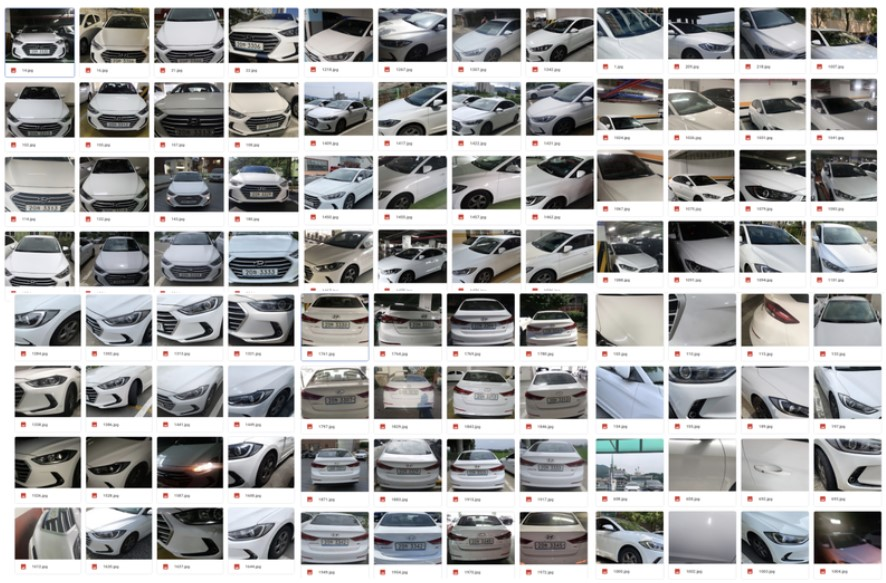

이전의 노드를 활용해서 이번에는 직접 Self-Supervised Learning을 구현할 예정.

ImageNet의 weigh를 탑재한 CNN 백본 네트워크를 이용해서 추출한 벡터로는 제대로 된 clustering된 결과를 얻기 어렵다. 그러나 Self-Supervised Learning을 이용하면 주어진 이미지의 특징을 학습하게 되어 Sementic(이미지의 의미를 잘 담은)한 벡터를 추출해 낼 수 있고 clustering의 성능을 향상시킬 수 있다.

우선 CIFAR-10에서 Self-Supervised Learning을 구현하는 과정을 실습해 보자. 프로젝트에서는 직접 socar 데이터를 이용하여 Self-Supervised Learning을 구현하고 소스 코드를 제출하면 된다.

PyTorch와 TensorFlow는 딥러닝 프레임워크의 양대 산맥이다.

- [텐서플로우 vs 파이토치](https://namu.wiki/w/%ED%85%90%EC%84%9C%ED%94%8C%EB%A1%9C%EC%9A%B0)
- [파이토치가 텐서플로우를 이겼다, 2020 AI현황보고서 8대 전망](http://www.aitimes.com/news/articleView.html?idxno=132756)
- [Pytorch vs Tensorflow 비교](https://data-newbie.tistory.com/425)

**학습 목표**

---
- EfficientNetB0를 이용하여 CIFAR-10 데이터의 representation vector를 추출 후 clustering 해 본다.
- Self-Supervised learning을 이용하여 CIFAR-10 데이터의 clustering 성능을 향상시킨다.
- 프로젝트 : VGG16을 이용하여 자동차 부위 사진의 representation vector를 추출 후 clustering 해 본다.
- 프로젝트 : Self-Supervised Learning을 이용하여 자동차 부위 사진의 clustering 성능을 향상시킨다.

**준비물**

---
torchvision에는 구현된 EfficientNet이 없기 때문에 아래 링크의 모델을 사용.

- [EfficientNet PyTorch](https://github.com/lukemelas/EfficientNet-PyTorch)

In [2]:
!pip install efficientnet_pytorch

## 8-2. CIFAR-10 데이터셋으로 clustering 해보기

자동차 부위사진은 프로젝트에서 다뤄보고 지금은 우선 CIFAR-10데이터를 이용하여 실습한다.

- [The CIFAR-10 dataset](https://www.cs.toronto.edu/~kriz/cifar.html)

`keras.dataset`으로부터 CIFAR-10 데이터셋을 불러오고 어떤 이미지들이 있는지 확인해보자.

Train: X=(50000, 32, 32, 3), y=(50000, 1)
Test: X=(10000, 32, 32, 3), y=(10000, 1)


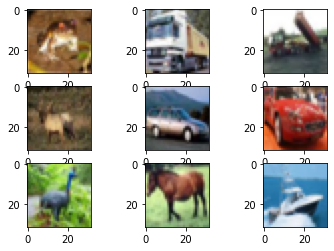

In [3]:
# example of loading the CIFAR-10 dataset
from matplotlib import pyplot
from keras.datasets import cifar10

# load dataset
(trainX, trainy), (testX, testy) = cifar10.load_data()

# summarize loaded dataset
print('Train: X=%s, y=%s' % (trainX.shape, trainy.shape))
print('Test: X=%s, y=%s' % (testX.shape, testy.shape))

# plot first few images
for i in range(9):
    # difine subplot
    pyplot.subplot(330 + 1 + i)
    # plot raw pixel data
    pyplot.imshow(trainX[i])
# show the figure
pyplot.show()

train과 test로 분리된 CIFAR-10 데이터셋을 하나로 합쳐준다.

In [4]:
import numpy as np
cifar10 = np.concatenate([trainX, testX])
cifar10_label = np.concatenate([trainy, testy])
print(cifar10.shape)
print(cifar10_label.shape)

(60000, 32, 32, 3)
(60000, 1)


**이미지를 flatten해서 clustering하기**

---
우선 (32,32,3) 모양을 가지는 3D array를 32x32x3 = 3072 크기의 1D array로 바꾸어서 clustering을 진행한다.

Clustering을 위해서는 우리가 흔히 사용하는 k-means Clustering을 사용한다. 아래의 영상을 통해 k-means Clustering에 대해 알아보자.

- [kmeans 클러스터링 알고리즘](https://www.youtube.com/watch?v=9TR54u08IGU&feature=youtu.be) 




In [5]:
from sklearn.cluster import KMeans

cifar10_1000 = cifar10[:1000] # 1,000장만 이용.

target_cluster_num = 10
rep_vec = cifar10_1000.reshape(cifar10_1000.shape[0], -1) # 3D array를 1D array로 변환.

kmeans = KMeans(n_clusters=target_cluster_num, random_state=0).fit(rep_vec)

raw_cluster_label = kmeans.predict(rep_vec)

각 클러스터별로 10개씩 이미지를 ploting해 준다. columns과 rows의 개수를 바꾸어서 더 많이 출력해 볼 수 있다.

cluster  0


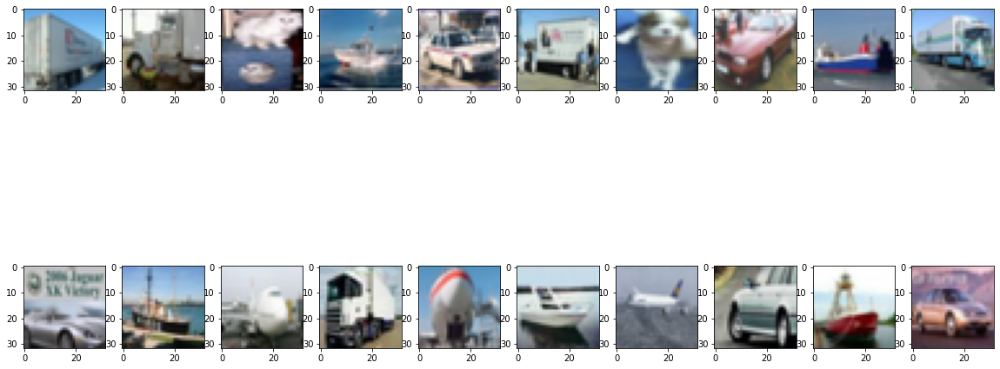

cluster  1


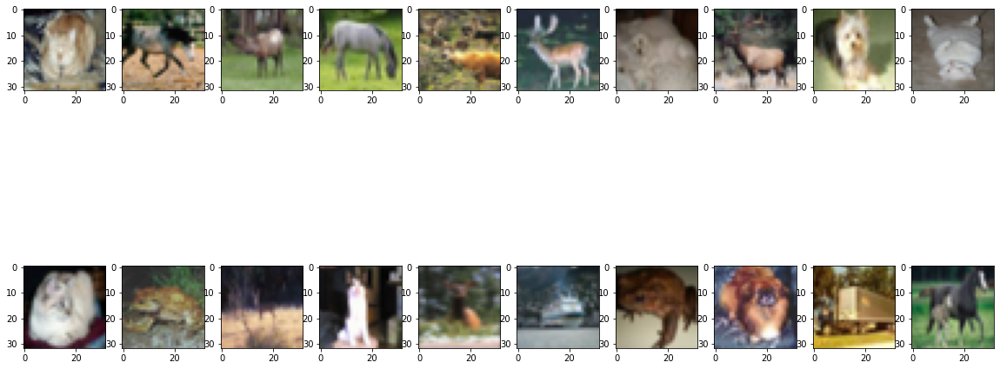

cluster  2


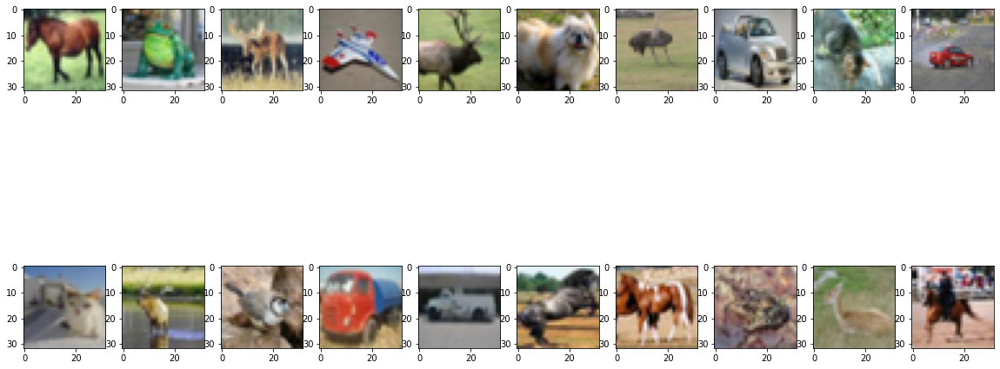

cluster  3


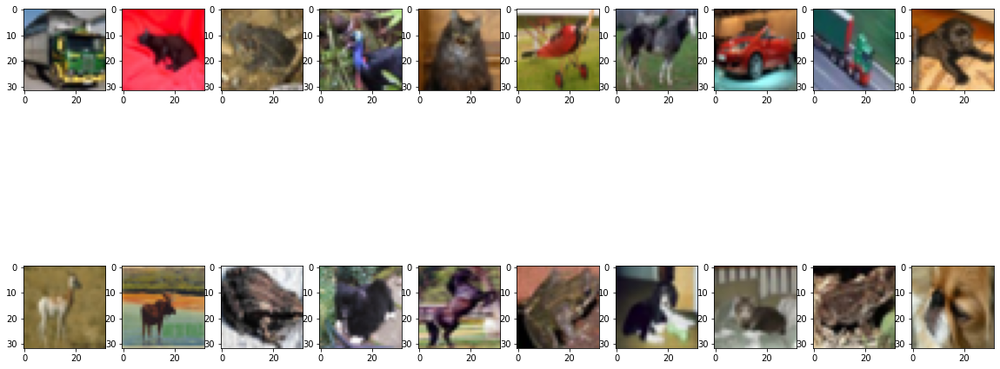

cluster  4


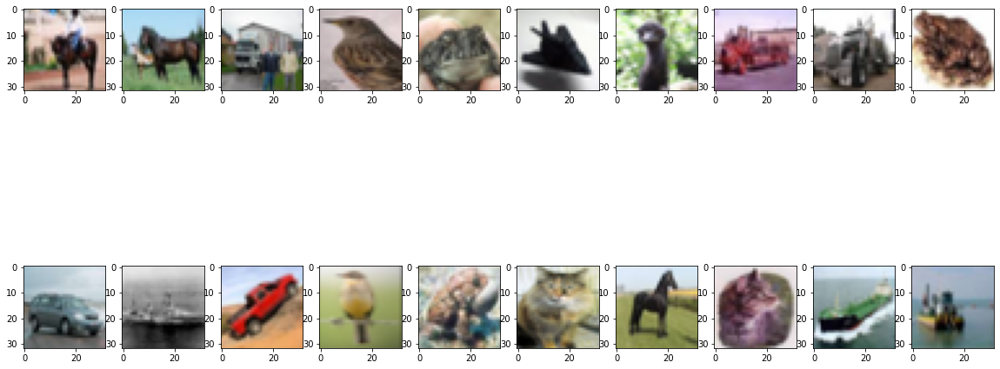

cluster  5


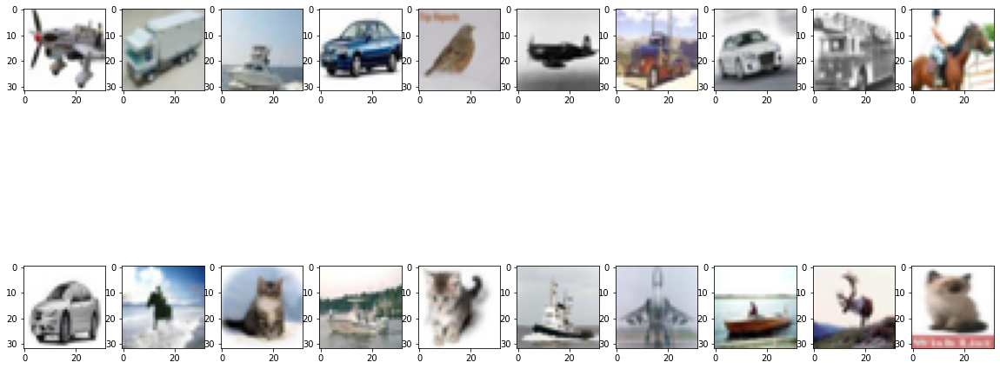

cluster  6


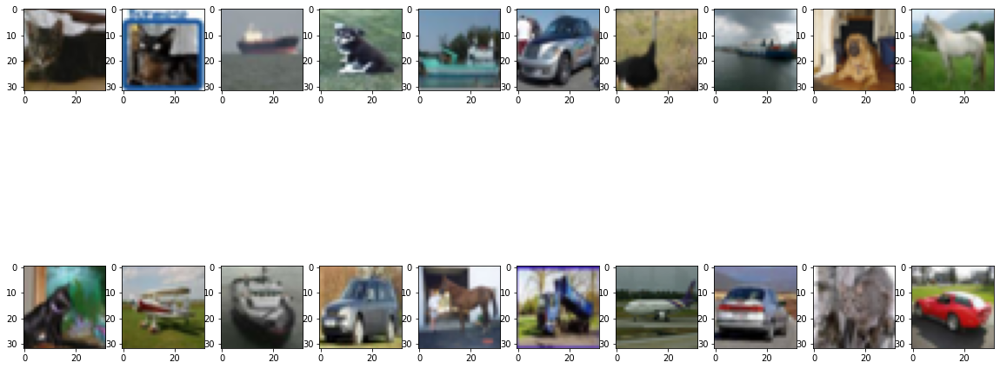

cluster  7


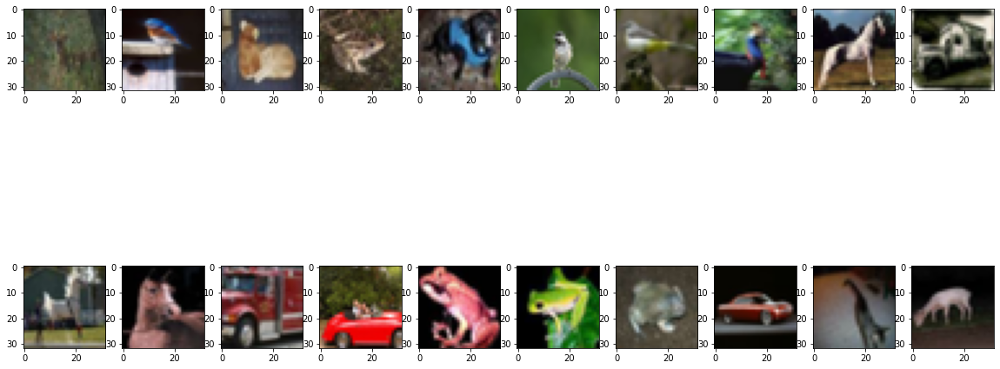

cluster  8


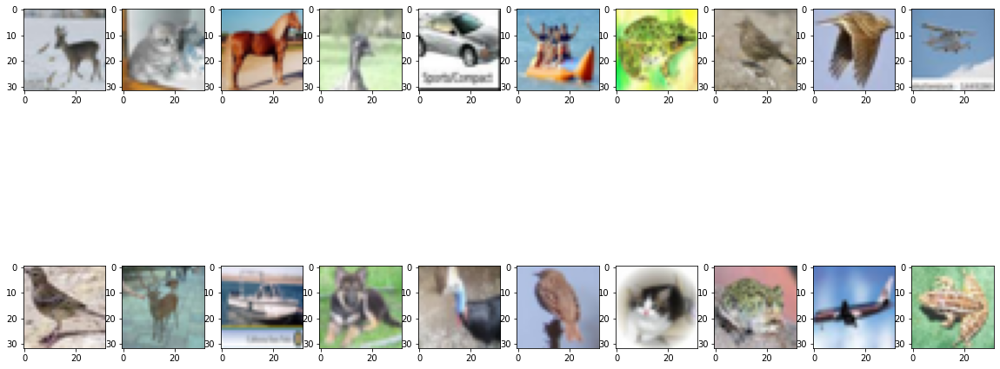

cluster  9


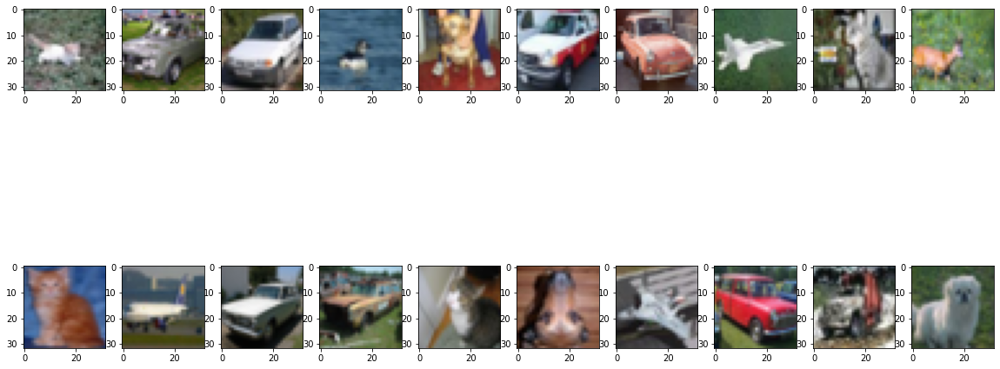

In [6]:
for id in range(10):
    print("cluster ", id)
    print("="*135)
    raw_selected_idxes = raw_cluster_label==id
    raw_selected_images = cifar10_1000[raw_selected_idxes]
    
    import matplotlib.pyplot as plt
    
    fig = plt.figure(figsize=(20,10))
    columns = 10
    rows = 2
    for i in range(1, columns*rows + 1): # sample 20개 이미지만 골라서
        img = raw_selected_images[i]
        fig.add_subplot(rows, columns,i)
        plt.imshow(img) # 이미지를 plotting
    plt.show()
    
    

T-SNE로 차원축소해서 이미지들 사이의 representation에 차이가 있는지 확인해 보자.<br>
각 클러스터별로 색깔을 다르게 주어 ploting한다.

/opt/conda/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


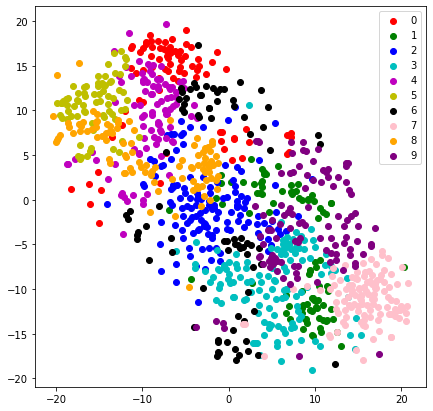

In [7]:
from sklearn.manifold import TSNE

# colored by k-means cluster
target_ids = range(0,10)

# T-SNE로 차원축소해서 이미지들 사이의 representation에 차이가 있는지 확인한다.
raw_x_embedded = TSNE(n_components=2).fit_transform(rep_vec)

plt.figure(figsize=(7,7))
colors = 'r', 'g', 'b', 'c', 'm', 'y', 'k', 'pink', 'orange', 'purple', 'olive', 'lime', 'palevioletred','teal', 'papayawhip', 'thistle', 'slategray', 'darkseagreen', 'salmon', 'rebeccapurple', 'beige'
for i, c, label in zip(target_ids, colors, target_ids):
    plt.scatter(raw_x_embedded[raw_cluster_label == i, 0], raw_x_embedded[raw_cluster_label == i, 1], c=c, label=label)
plt.legend()
plt.show()

### 8-3. EfficientNetB0(ImageNet-weight)로 추출한 Representation Vector로 이미지 Clustering 해보기

**ImageNet-weight를 탑재한 EfficientNetB0로 Representation Vector 뽑아보기**

---
CIFAR-10 이미지를 아래와 같은 경로에 저장 후 이용하도록 한다.

In [8]:
import os
from PIL import Image
for index, image in enumerate(cifar10) : 
  img = Image.fromarray(image, 'RGB')
  img.save(os.getenv('HOME') + '/aiffel/socar_clustering/cifar/images/cifar10/'+str(index).zfill(5)+'.png')

**필요한 모듈 불러오기**

In [9]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.optim import lr_scheduler
import numpy as np
import pandas as pd
import torchvision
from torchvision import datasets, models, transforms
import matplotlib.pyplot as plt
import time
import os
import copy
import cv2
import seaborn as sns
import numpy as np
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
import PIL.Image as Image
import shutil

from PIL import ImageFile
ImageFile.LOAD_TRUNCATED_IMAGES = True

import sklearn
from sklearn.manifold import TSNE
from sklearn.cluster import KMeans

device = 'cuda:0'

이미지 경로를 입력하고 개수 확인.

In [10]:
img_path = os.getenv('HOME') + '/aiffel/socar_clustering/cifar/images/cifar10/'
print(f'분석 대상 이미지들의 개수: {len(os.listdir(img_path))} 개')

분석 대상 이미지들의 개수: 60000 개


분석할 이미지들의 크기를 Resizing하고 tensor로 변환한 후, Dataloader를 생성.

In [11]:
data_transforms = transforms.Compose([
    transforms.Resize((224,224), interpolation=Image.NEAREST), # image resize
    transforms.ToTensor(),    # tensor로 변환
])

# Dataloader 생성
def create_dataloader(path):
    
    # torch dataset으로 wrapping
    target_datasets = datasets.ImageFolder(path, transform=data_transforms)
    
    # dataloader로 wrapping return
    dataloader = torch.utils.data.DataLoader(
        target_datasets,
        shuffle=False
    )
    
    return dataloader

dataloader = create_dataloader(os.getenv('HOME') + '/aiffel/socar_clustering/cifar/images' )
    

/opt/conda/lib/python3.9/site-packages/torchvision/transforms/transforms.py:280: UserWarning: Argument interpolation should be of type InterpolationMode instead of int. Please, use InterpolationMode enum.
  warnings.warn(


사전학습된 EfficientNetB0를 load.

In [12]:
from efficientnet_pytorch import EfficientNet

net = EfficientNet.from_pretrained("efficientnet-b0", advprop=True)
model = net
model.to(device)

Loaded pretrained weights for efficientnet-b0


EfficientNet(
  (_conv_stem): Conv2dStaticSamePadding(
    3, 32, kernel_size=(3, 3), stride=(2, 2), bias=False
    (static_padding): ZeroPad2d(padding=(0, 1, 0, 1), value=0.0)
  )
  (_bn0): BatchNorm2d(32, eps=0.001, momentum=0.010000000000000009, affine=True, track_running_stats=True)
  (_blocks): ModuleList(
    (0): MBConvBlock(
      (_depthwise_conv): Conv2dStaticSamePadding(
        32, 32, kernel_size=(3, 3), stride=[1, 1], groups=32, bias=False
        (static_padding): ZeroPad2d(padding=(1, 1, 1, 1), value=0.0)
      )
      (_bn1): BatchNorm2d(32, eps=0.001, momentum=0.010000000000000009, affine=True, track_running_stats=True)
      (_se_reduce): Conv2dStaticSamePadding(
        32, 8, kernel_size=(1, 1), stride=(1, 1)
        (static_padding): Identity()
      )
      (_se_expand): Conv2dStaticSamePadding(
        8, 32, kernel_size=(1, 1), stride=(1, 1)
        (static_padding): Identity()
      )
      (_project_conv): Conv2dStaticSamePadding(
        32, 16, kernel_size=

model과 dataloader를 입력하면, size 갯수만큼 representation vector를 추출하는 `provide_representations_sample()`함수를 만들어보자.

In [13]:
def provide_representations_sample(model, dataloader, size):

    representations = list()
    filenames = list()
    model.eval()

    for idx, (inputs, labels) in enumerate(dataloader):

        inputs = inputs.to(device)
   
        outputs =  model.extract_features(inputs)
        outputs = outputs.cpu().detach().numpy()
        outputs = outputs.reshape(outputs.shape[0],-1)
        
        filename, _ = dataloader.dataset.samples[idx]

        representations.append(outputs)
        filenames.append(filename)
        
        if idx > size-2 : 
            break

    representations = np.asarray(representations) # N x 1 x ?
    representations = np.squeeze(representations , axis=1) # dimension을 하나 줄임. N x ?
    
    filenames = np.asarray(filenames)
    
    return representations, filenames

먼저 1000개의 이미지에 대해서만 representation vector로 추출.

In [14]:
representations, filenames = provide_representations_sample(model, dataloader,1000)
print('Representation Shape: ', representations.shape)

Representation Shape:  (1000, 62720)


<br>

**ImageNet-weight로 추출한 Representation Vector로 이미지 Clustering 해보기.**

---
Representation Vector를 추출한 이후, 이들을 Clustering 해볼 수 있다.

Clustering 과정은 아래와 같다.

> 1. filename과 representation vector 매칭하기.
> 2. k-means clustering을 이용해서 representation vector를 clustering 하기.
> 3. cluster 결과 시각화.

k-means clustering 알고리즘을 이용해서 `cluster_label`을 추출해보자.

In [15]:
target_cluster_num = 10
kmeans = KMeans(n_clusters=target_cluster_num,
                random_state=0).fit(representations)

cluster_label = kmeans.predict(representations)

`cluster_label`을 얻었으니 각 이미지 파일에 레이블을 할당해서 plotting을 해 보자.

총 10개의 cluster가 존재하기 때문에 10번의 for문 안에서 각각의 cluster에 할당된 이미지 파일이름을 얻어내고 ploting을 해주는 작업을 해 주도록 한다.

cluster  0


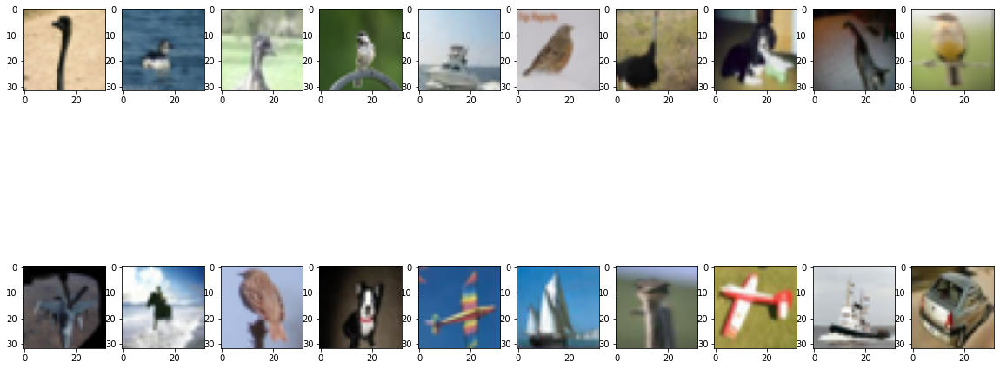

cluster  1


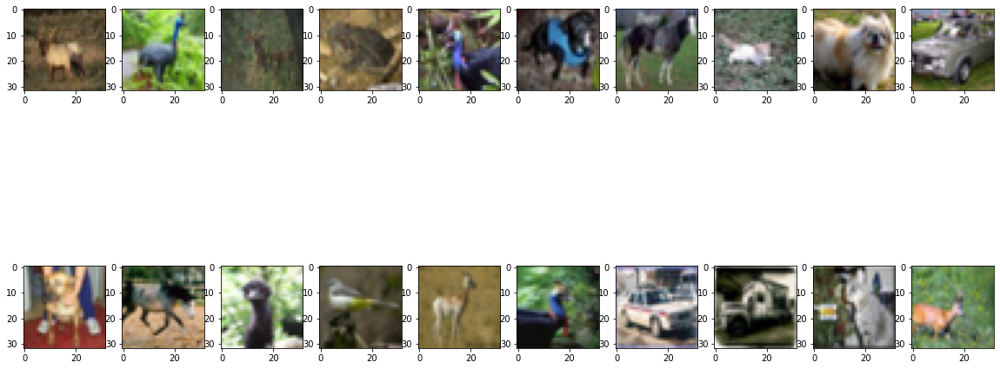

cluster  2


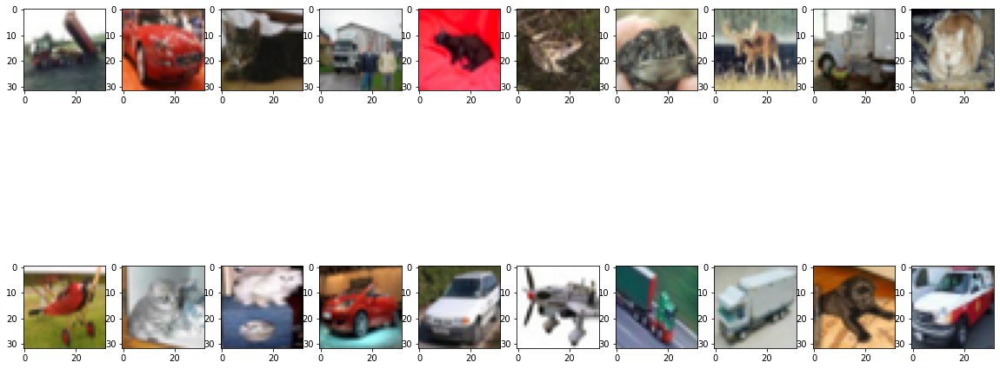

cluster  3


<Figure size 1440x720 with 0 Axes>

cluster  4


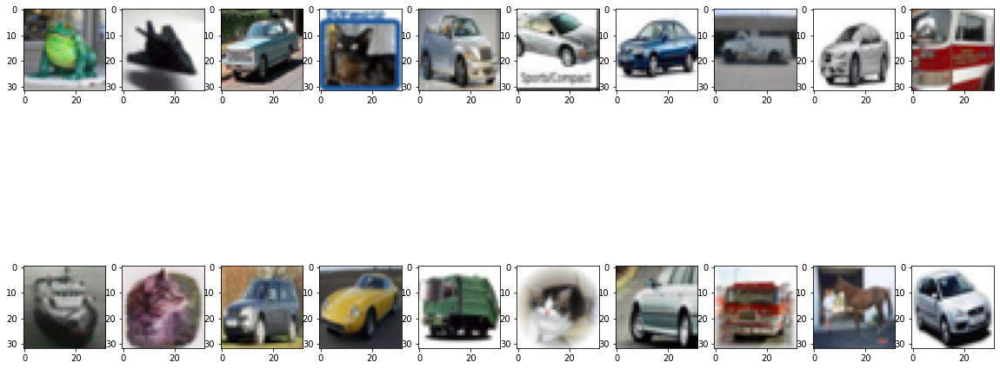

cluster  5


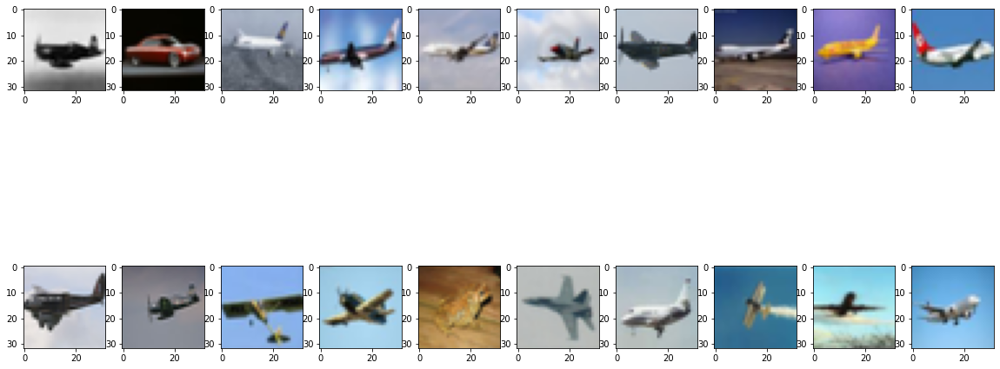

cluster  6


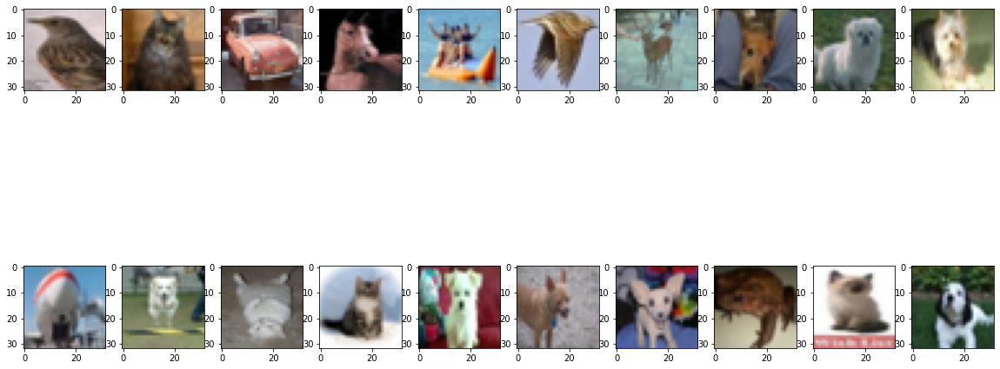

cluster  7


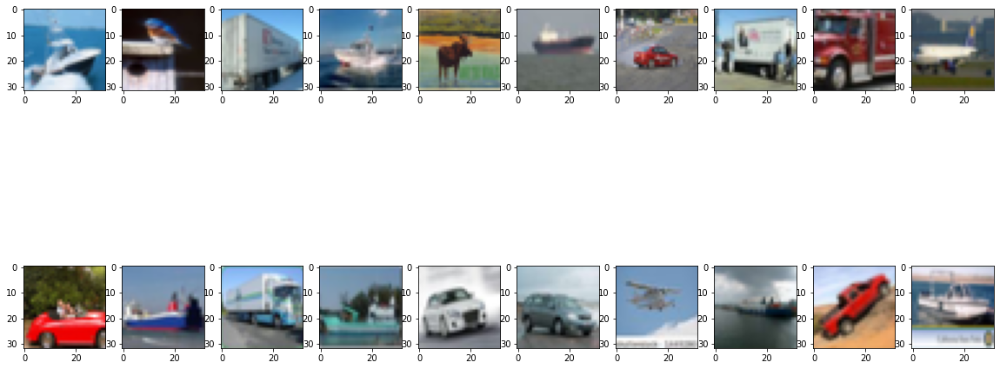

cluster  8


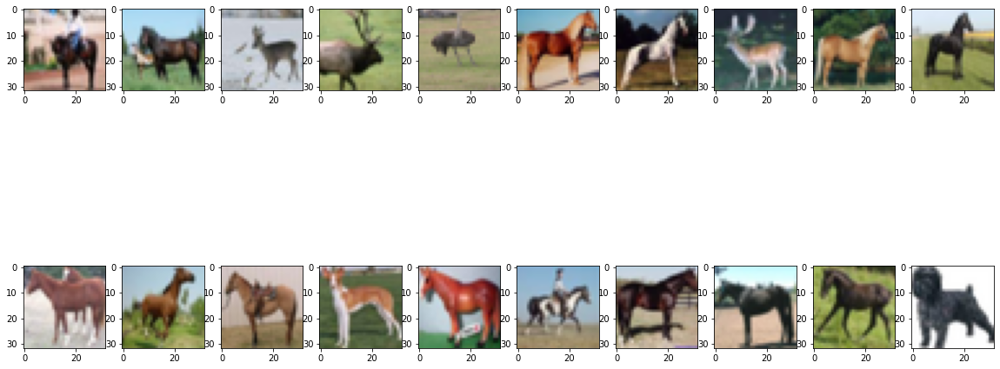

cluster  9


<Figure size 1440x720 with 0 Axes>

In [16]:
for id in range(10) :
    print("cluster ", id)
    print("="*135)
    selected_idxes = cluster_label==id
    selected_filenames = filenames[selected_idxes]

    fig = plt.figure(figsize=(20, 10))
    columns = 10
    rows = 2
    for i in range(1, columns*rows +1):  # 샘플 10개 이미지만 골라서
        try:
            filepath = selected_filenames[i]
            img = cv2.imread(filepath)[:,:,::-1] # 이미지로 읽은 후에 -> RGB 채널을 순서를 변경해주고

            fig.add_subplot(rows, columns, i)
            plt.imshow(img)# 이미지를 plotting 합니다.
        except:
            pass
    plt.show()

Clustering한 결과를 보면, 이미지 자체를 이용한 것보다 훨씬 잘 되는 것을 볼 수 있다. 하지만 여전히 완벽히 Clustering되지는 않는 것 같다.

T-SNE로 차원축소해서 이미지들 사이의 representation에 차이가 있는지 확인해보자. k-means로 나눠진 label별로 색깔을 넣어 보자.

/opt/conda/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


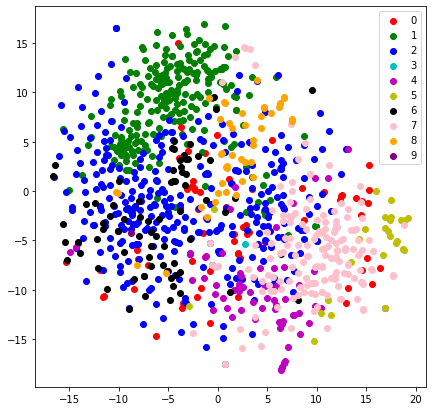

In [17]:
#colored by k-means cluster
x_embedded = TSNE(n_components=2).fit_transform(representations)
target_ids = range(0,10)


plt.figure(figsize=(7, 7))
colors = 'r', 'g', 'b', 'c', 'm', 'y', 'k', 'pink', 'orange', 'purple', 'olive', 'lime', 'palevioletred','teal', 'papayawhip', 'thistle', 'slategray', 'darkseagreen', 'salmon', 'rebeccapurple', 'beige'

for i, c, label in zip(target_ids, colors, target_ids):
    plt.scatter(x_embedded[cluster_label == i, 0], x_embedded[cluster_label == i, 1], c=c, label=label)
plt.legend()
plt.show()

시각화 결과를 보니 대체적으로 군집이 겹쳐서 형성되어있다. 좋은 결과를 얻었다고 보기는 힘들 것 같다.

<br>

### 8-4. Self-Supervised Learning 기법 중 Rotation Prediction 구현하기.

ImageNet-weight로 추출한 Representation으로는 잘 Clustering이 되지 않았다. ImageNet-weight이 CIFAR-10 이미지의 특징을 잘 알지 못한다는 것이다. 그렇다면 어떻게 해야 CIFAR-10 이미지의 특징을 잘 추출해 낼 수 있을까? 이전 노드에서 이미 배운 내용에 답이 있다. 바로 Self-Supervised Learning을 이용하면 가능하다.

Self-supervised Learning에는 다양한 pre task 기법들이 있다. <br>
그중 rotation 기법을 사용해 볼 것이다. 

- [Unsupervised Representation Learning by Predicting Image Rotations](https://arxiv.org/pdf/1803.07728.pdf)

아래와 같은 순서로 구현.

1. Rotation Prediction을 위한 데이터셋 만들기
2. Rotation Prediction 신경망 구성하기
3. Rotation Prediction 학습시키기

<br>

**1. Rotation Prediction을 위한 데이터셋 만들기**

---
데이터셋을 만들기 위하여 총 4개의 함수가 정의된다.

1. create_rotnet_set
2. path_to_train_test_filenames
3. rotate_and_save
4. image_rotator

`create_rotnet_set` 함수를 호출하면 cifar 디렉토리 밑에 아래와 같은 구조로 데이터셋이 생성이 된다.


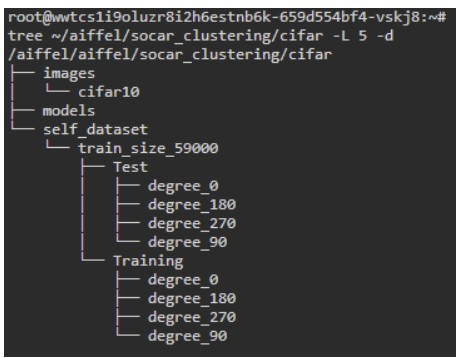

CIFAR-10에 들어있는 60,000개의 이미지를 각각 0도, 90도, 180도, 270도 회전시켜서 정해준 사이즈대로 train과 test로 분리 후 저장을 하게 된다.

이제 각각의 함수를 정의해 보자.

`create_rotnet_set`함수 내에서 `path_to_train_test_filenames`와 `rotate_and_save` 함수가 호출되고 `rotate_and_save`내에서 `image_rotator`가 호출되는 구조이다.

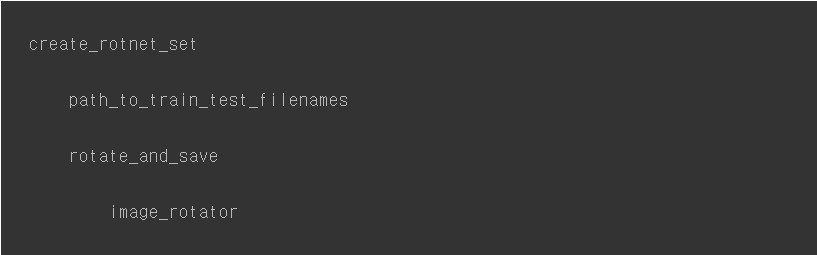

`create_rotnet_set`함수는 `path_to_train_test_filenames`함수로부터 `Train과 Test 파일이름`을 추출받아서 `rotate_and_save`함수로 해당 파일을 회전하고 저장하는 함수이다.

In [18]:
def create_rotnet_set(base_dir, self_train_size, self_test_size):
    
    # Candidate Train, Test Filename 추출
    candidate_train_filenames, candidate_test_filenames = \
    path_to_train_test_filenames(base_dir, self_train_size, self_test_size)
    
    # Rotation 수행
    print('>> Start Making a Rotated Set...')
    save_base = os.path.join(base_dir, 'self_dataset', 'train_size_' + str(self_train_size))
    
    print('> Start Rotating Training Set...')
    train_save_dir = os.path.join(save_base, 'Training')
    if not os.path.exists(train_save_dir):
        os.makedirs(train_save_dir)
    rotate_and_save(candidate_train_filenames, train_save_dir)
        
    print('> Start Rotating Test Set...')
    test_save_dir = os.path.join(save_base, 'Test')
    if not os.path.exists(test_save_dir):
        os.makedirs(test_save_dir)
    rotate_and_save(candidate_test_filenames, test_save_dir)


`path_to_train_test_filenames` 함수는 `회전할 파일이 저장된 디렉토리경로`와 `학습 데이터의 크기`와 `테스트 데이터의 크기`를 받아서 클래스 별로 파일이름을 train, test로 분리하여 return해주는 함수이다. 여기서 클래스가 의미하는 것은 데이터셋 `CIFAR-10`이다.

In [19]:
def path_to_train_test_filenames(base_dir, self_train_size, self_test_size):
    candidate_train_filenames = list()
    candidate_test_filenames = list()
    
    # 각 Class 별로 파일 이름 모으고
    target_src_path = os.path.join(base_dir, 'images')
    print('>>>>>>', target_src_path)
    print(os.listdir(target_src_path))
    
    for class_name in sorted(os.listdir(target_src_path)):
        
        class_path = os.path.join(target_src_path, class_name)
        class_test_filenames = sorted(os.listdir(class_path))[:self_test_size]
        class_train_filenames = sorted(os.listdir(class_path))[self_test_size : self_test_size+self_train_size]
        
        for class_filename in class_test_filenames:
            class_filepath = os.path.join(class_path, class_filename)
            candidate_test_filenames.append(class_filepath)
        
        for class_filename in class_train_filenames:
            class_filepath = os.path.join(class_path, class_filename)
            candidate_train_filenames.append(class_filepath)
            
    print('Train for Self: ', len(candidate_train_filenames))            
    print('Test for Self: ', len(candidate_test_filenames))
    
    return candidate_train_filenames, candidate_test_filenames


`rotate_and_save`함수는 파일 이름을 받아서 이미지를 0,90,180,270도씩 각각 회전시킨 후 디렉토리에 나누어 저장하는 함수.

In [20]:
def rotate_and_save(src_filenames, save_dir):
    rotation_list = [0, 90, 180, 270]
        
    for rotation_degree in rotation_list:
        print('> working on degree '+ str(rotation_degree))
        
        rot_save_dir = os.path.join(save_dir, 'degree_' + str(rotation_degree))
        if not os.path.exists(rot_save_dir):
            os.makedirs(rot_save_dir)

        for src_filename in src_filenames:

            img = cv2.imread(src_filename)
            rotated_img = image_rotator(img, rotation_degree)
    
            cv2.imwrite(os.path.join(rot_save_dir, src_filename.split('/')[-1]), rotated_img)


`image_rotator`함수는 img파일을 받아서 cv2를 이용하여 직접 회전시키고 회전시킨 이미지를 반환하는 함수.

In [21]:
def image_rotator(img, rotate_type):
    
    if rotate_type == 0:
        rotated_img = img
    
    elif rotate_type == 90:
        rotated_img = cv2.rotate(img, cv2.ROTATE_90_CLOCKWISE)
        
    elif rotate_type == 180:
        rotated_img = cv2.rotate(img, cv2.ROTATE_180)
        
    elif rotate_type == 270:
        rotated_img = cv2.rotate(img, cv2.ROTATE_90_COUNTERCLOCKWISE)
        
    else:
        raise ValueError

    return rotated_img

이제 학습 데이터와 테스트 데이터의 크기를 정하고 데이터셋을 생성한다.

In [22]:
# Self Supervised Learning 학습을 위한 Training / Test set 생성
self_dataset_path = os.getenv('HOME')+'/aiffel/socar_clustering/cifar/'
self_train_size = 50000
self_test_size = 10000

create_rotnet_set(self_dataset_path, self_train_size, self_test_size)

>>>>>> /aiffel/aiffel/socar_clustering/cifar/images
['cifar10']
Train for Self:  50000
Test for Self:  10000
>> Start Making a Rotated Set...
> Start Rotating Training Set...
> working on degree 0
> working on degree 90
> working on degree 180
> working on degree 270
> Start Rotating Test Set...
> working on degree 0
> working on degree 90
> working on degree 180
> working on degree 270


위에서 보여줬던 디렉토리 구조대로 잘 생성되었는지 확인해보자. 아래 명령어로 터미널을 열어 실행시키면 된다.

`$ sudo apt-get install tree <br>
$ tree ~/aiffel/socar_clustering -L 5 -d`

잘 생성되었다면 torch의 DataLoader를 이용하여 Wrapping을 진행해준다.

In [23]:
train_dir = os.getenv('HOME')+'/aiffel/socar_clustering/cifar/self_dataset/train_size_'+str(self_train_size)+'/Training'
test_dir = os.getenv('HOME')+'/aiffel/socar_clustering/cifar/self_dataset/train_size_'+str(self_train_size)+'/Test'

data_transforms = transforms.Compose([
    transforms.Resize((224,224), interpolation=Image.NEAREST),
    transforms.ToTensor(),
])

train_datasets = datasets.ImageFolder(train_dir, transform=data_transforms)
train_loaders = torch.utils.data.DataLoader(
    train_datasets,
    batch_size=4,
    shuffle=True,
)

test_datasets = datasets.ImageFolder(test_dir, transform=data_transforms)
test_loaders = torch.utils.data.DataLoader(
    test_datasets,
    shuffle=True
)

dataloaders = {
    'train':train_loaders,
    'test':test_loaders
}

/opt/conda/lib/python3.9/site-packages/torchvision/transforms/transforms.py:280: UserWarning: Argument interpolation should be of type InterpolationMode instead of int. Please, use InterpolationMode enum.
  warnings.warn(


<br>

**2. Rotation Prediction 신경망 구성하기**

---

In [24]:
pretext_model = EfficientNet.from_pretrained("efficientnet-b0", advprop=True)
pretext_model._fc = nn.Linear(1280, 4)
pretext_model.to(device)

criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(pretext_model.parameters(), lr=0.01)

Loaded pretrained weights for efficientnet-b0


학습하는데 1epoch당 2시간 이상씩 상당한 시간이 소요된다. 직접 학습을 진행해 보면 좋겠지만 **다음 스텝에서 미리 학습된 weight을 이용하여 진행한다.**

In [ ]:
num_epochs=20
model = pretext_model

train_acc_list = []
train_loss_list = []
test_acc_list = []
test_loss_list = []

since = time.time()

best_model_wts = copy.deepcopy(model.state_dict())
best_acc = 0.0

for epoch in range(num_epochs):
    print(f'Epoch {epoch}/{num_epochs - 1}')
    print('-' * 20)
    
    # Each epoch has a training and validation phase
    for phase in ['train', 'test']:
        
        if phase == 'train':
            model.train() # Set model to training mode
        else:
            model.eval() # Set model to evaluate model
            
        running_loss = 0.0
        running_corrects = 0
        
        
        # Iterate over data.
        for inputs, labels in dataloaders[phase]:
            inputs = inputs.to(device)
            labels = labels.to(device)
            # print(labels)
            # print(labels.shape)
            # break
            # zero the parameter gradients
            optimizer.zero_grad()
            
            # forward
            # track history if only in train
            with torch.set_grad_enabled(phase == 'train'):
                outputs = model(inputs)
                _, preds = torch.max(outputs, 1)
                loss = criterion(outputs, labels)
                
                # backward + optimize only if in training phase
                if phase == "train":
                    loss.backward()
                    optimizer.step()
                    
            # statistics
            running_loss += loss.item() * inputs.size(0)
            running_corrects += torch.sum(preds == labels.data)
            
        epoch_loss = running_loss / len(dataloaders[phase].dataset)
        epoch_acc = running_corrects.double() / len(dataloaders[phase].dataset)
        
        print('>> Phase: ', phase)
        print('{} Loss: {:.4f} Acc: {:.4f}'.format(
            phase, epoch_loss, epoch_acc))
        
        if phase == 'train':
            train_acc_list.append(epoch_acc)
            train_loss_list.append(epoch_loss)
        else:
            test_acc_list.append(apoch_acc)
            test_loss_list.append(epoch_loss)
            
        # deep copy the model
        if phase == 'test' and epoch_acc > best_acc:
            best_acc = epoch_acc
            best_model_wts = copy.deepcopy(model.state_dict())
            
time_elapsed = time.time() - since
print('Training complete in {:.0f}m {:.0f}s'.format(
    time_elapsed // 60, time_elapsed % 60))
print('Best test Acc: {:4f}'.format(best_acc))

# load best model weights
# model.load_state_dict(best_model_wts)
models_dir = os.getenv('HOME')+'/aiffel/socar_clustering/cifar/models/'
torch.save(best_model_wts , models_dir + 'pretrained_effb0_orignal_cifar10_50000.pt')

loss and accuracy graph

In [ ]:
# loss graph
from matplotlib import pyplot as plt
plt.plot(train_loss_list)
plt.plot(test_loss_list)
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

In [ ]:
plt.plot(train_acc_list)
plt.plot(test_acc_list)
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

아래와 같은 loss, accuracy 그래프가 나온다.

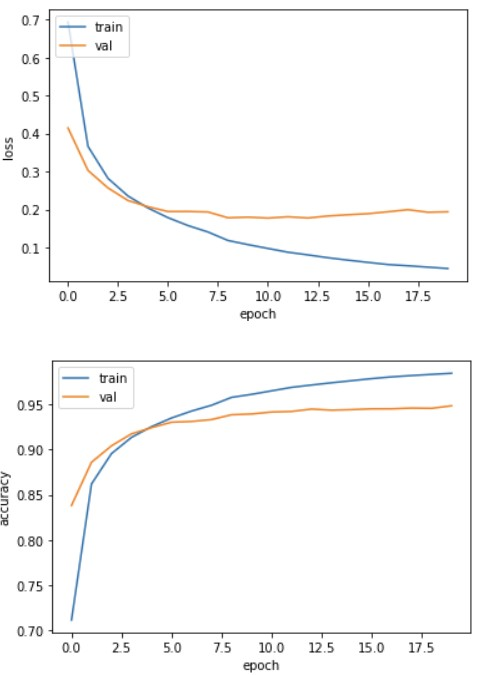

5 epoch 이후부터는 훈련 loss는 쭉 더 내려가지만 검증 loss가 크게 떨어지지 않고 있음을 알 수 있다. 보통의 classification 문제라면 overfitting을 막기 위해 적절한 `train_loss`와 `val_loss`가 크게 차이가 나지 않는 선에서 학습을 멈춰야 한다. 하지만 현재 가진 데이터에 대한 좋은 `특징 추출기`를 만들어 내는 것이 목적이므로 epoch 수를 더 크게 하여 훈련 데이터에 fit하게 학습하는 것도 좋은 방법일 수 있다.

### 8-5. Self-Supervised Weight를 이용해 Representation Vector를 뽑고, Clustering 해보기.

앞서 Rotation Prediction을 풀어낸 EfficientNetB0 weight를 얻었으니, 이 weight을 이용해서 CIFAR-10 이미지의 Representation Vector를 추출해 보자.

이번 스텝은 아래의 순서대로 진행할 예정.

1. Rotation prediction을 수행한 weight를 EfficientNetB0에 import 하기
2. EfficientNetB0으로 representation vector 추출하기
3. k-means Clustering으로 Cluster 생성하기
4. T-sne로 차원 시각화하기

`cloud shell`에서 아래 명령어를 통해 디렉토리를 만들고 미리 학습시켜둔 모델을 복사할 예정.

`$ cd ~/aiffel/socar_clustering/cifar/models <br>
$ wget https://d3s0tskafalll9.cloudfront.net/media/documents/pretrained_effb0_cifar10_50000.pt`

In [26]:
# Representation Vector 추출하고, Clustering 다시 수행

final_model = EfficientNet.from_pretrained("efficientnet-b0", advprop=True)
final_model._fc = nn.Linear(1280, 4)
final_model.load_state_dict(torch.load(os.getenv('HOME')+'/aiffel/socar_clustering/cifar/models/pretrained_effb0_cifar10_50000.pt'))
final_model.to(device)

Loaded pretrained weights for efficientnet-b0


EfficientNet(
  (_conv_stem): Conv2dStaticSamePadding(
    3, 32, kernel_size=(3, 3), stride=(2, 2), bias=False
    (static_padding): ZeroPad2d(padding=(0, 1, 0, 1), value=0.0)
  )
  (_bn0): BatchNorm2d(32, eps=0.001, momentum=0.010000000000000009, affine=True, track_running_stats=True)
  (_blocks): ModuleList(
    (0): MBConvBlock(
      (_depthwise_conv): Conv2dStaticSamePadding(
        32, 32, kernel_size=(3, 3), stride=[1, 1], groups=32, bias=False
        (static_padding): ZeroPad2d(padding=(1, 1, 1, 1), value=0.0)
      )
      (_bn1): BatchNorm2d(32, eps=0.001, momentum=0.010000000000000009, affine=True, track_running_stats=True)
      (_se_reduce): Conv2dStaticSamePadding(
        32, 8, kernel_size=(1, 1), stride=(1, 1)
        (static_padding): Identity()
      )
      (_se_expand): Conv2dStaticSamePadding(
        8, 32, kernel_size=(1, 1), stride=(1, 1)
        (static_padding): Identity()
      )
      (_project_conv): Conv2dStaticSamePadding(
        32, 16, kernel_size=

In [30]:
# model, dataloader를 input으로 제공한 이후, representation vector를 추출
def provide_representations_sample(model, dataloader, size):

    representations = list()
    filenames = list()
    model.eval()

    for idx, (inputs, labels) in enumerate(dataloader):

        inputs = inputs.to(device)
        # outputs = model(inputs)
        outputs =  model.extract_features(inputs)
        outputs = outputs.cpu().detach().numpy()
        outputs = outputs.reshape(outputs.shape[0],-1)
        
        filename, _ = dataloader.dataset.samples[idx]

        representations.append(outputs)
        filenames.append(filename)
        
        if idx > size-2 : 
            break

    representations = np.asarray(representations) # N x 1 x ?
    representations = np.squeeze(representations , axis=1) # dimension을 하나 줄여주고 -> N x ?
    
    filenames = np.asarray(filenames)
    
    return representations, filenames

In [31]:
final_representations, filenames = provide_representations_sample(final_model, dataloader, 1000)
print(final_representations.shape)
print(filenames.shape)

(1000, 62720)
(1000,)


In [32]:
# Clustering 
target_cluser_num = 10
final_kmeans = KMeans(n_clusters=target_cluster_num,
                      random_state=0).fit(final_representations)

final_cluster_label = final_kmeans.predict(final_representations)

cluster  0


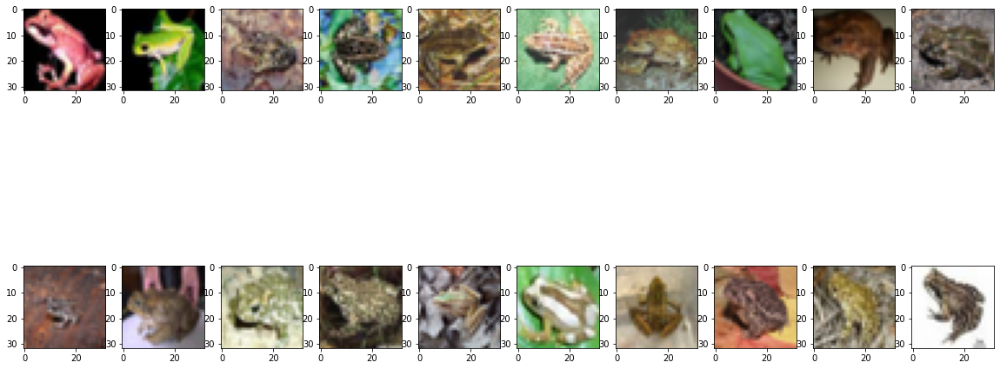

cluster  1


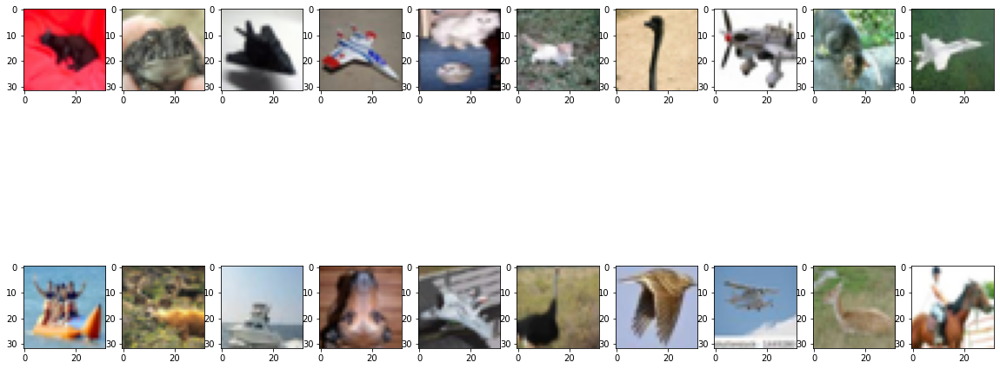

cluster  2


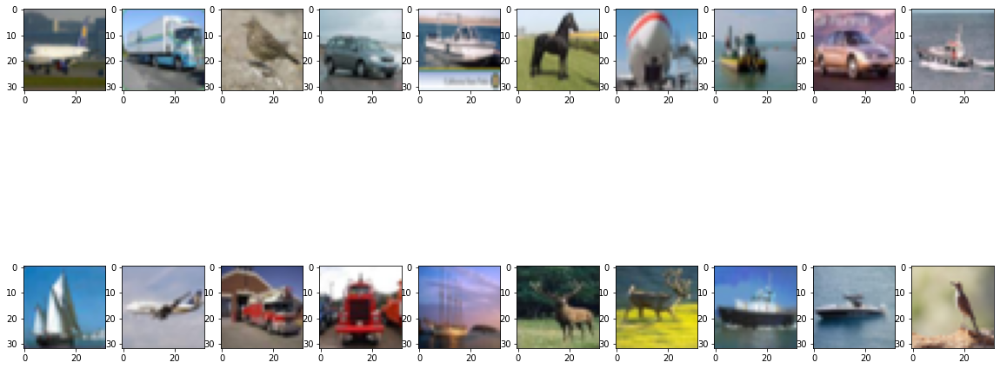

cluster  3


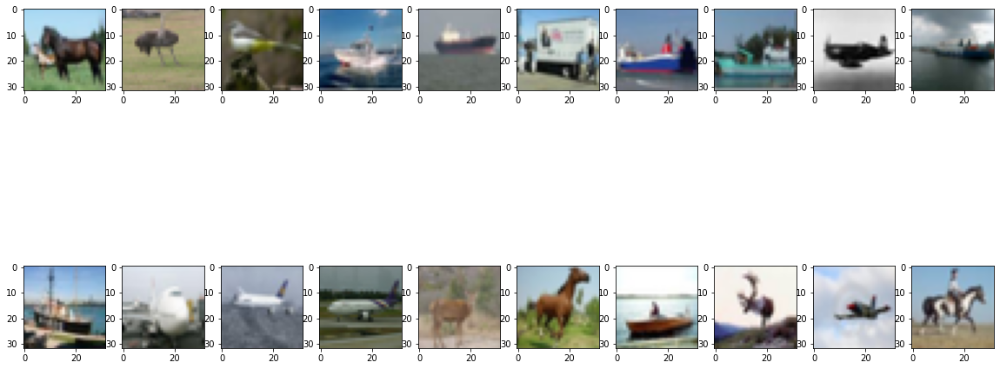

cluster  4


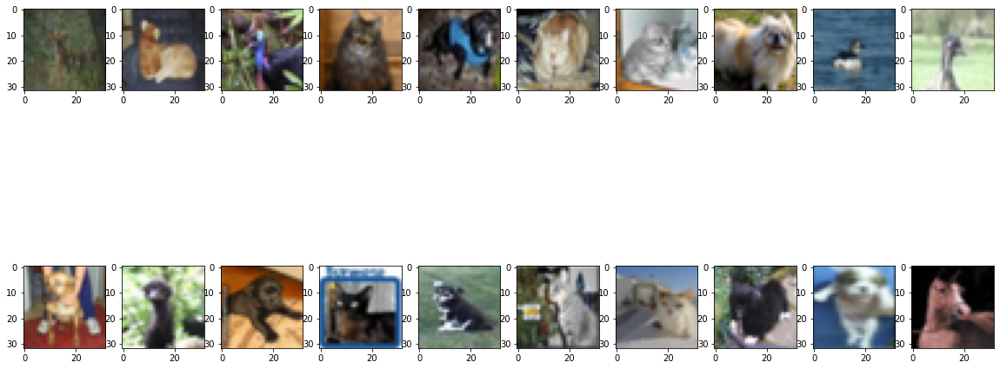

cluster  5


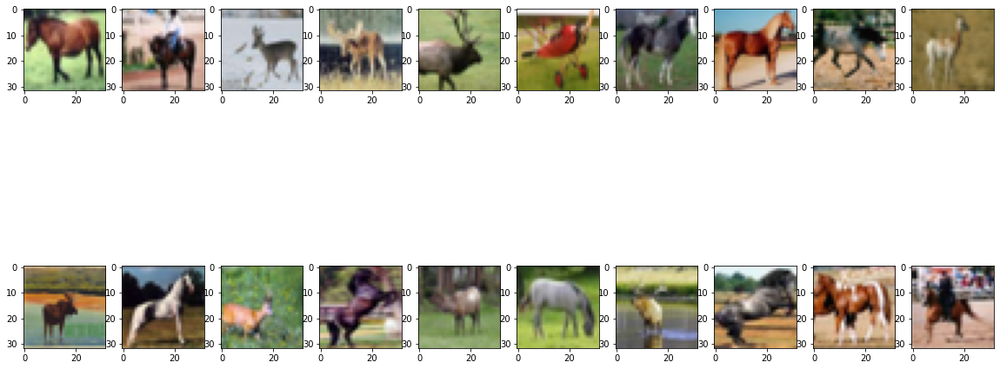

cluster  6


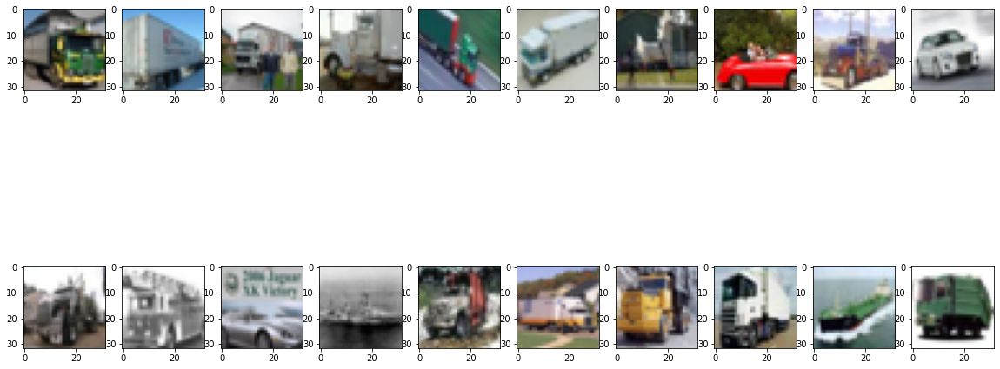

cluster  7


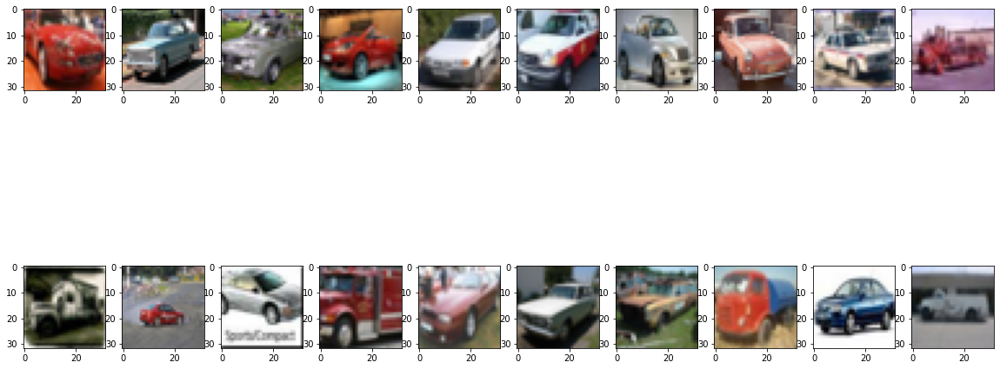

cluster  8


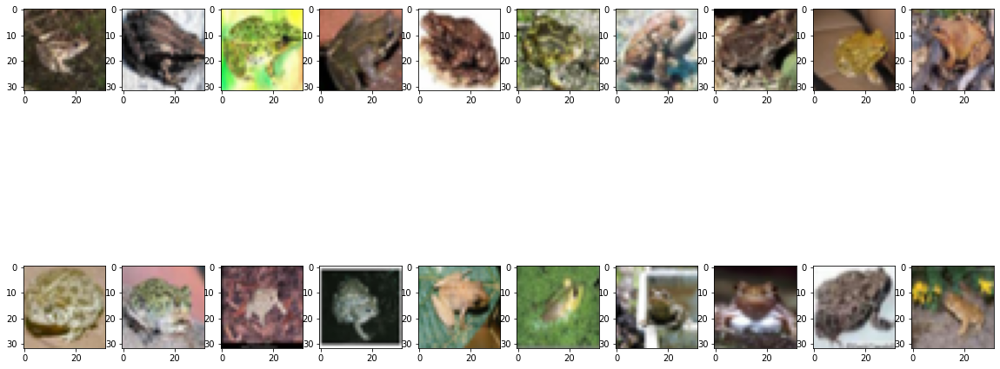

cluster  9


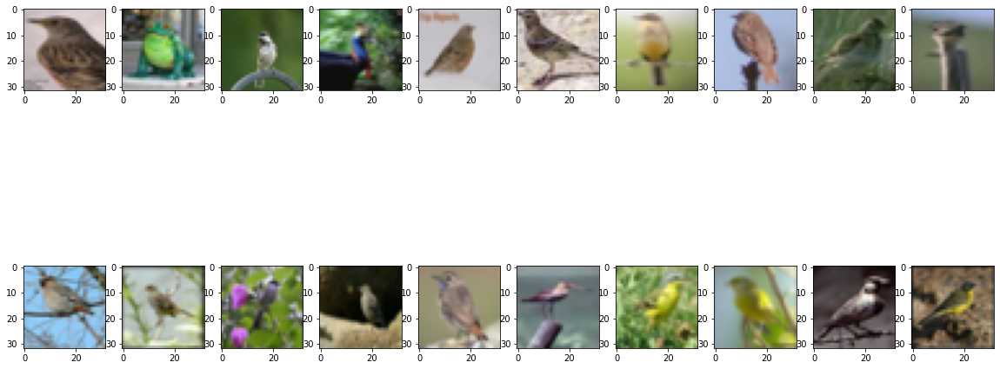

In [33]:
for id in range(10) : 
    print("cluster ", id)
    print("="*135)
    final_selected_idxes = final_cluster_label==id
    final_selected_filenames = filenames[final_selected_idxes]

    fig = plt.figure(figsize=(20, 10))
    columns = 10
    rows = 2
    for i in range(1, columns*rows +1):  # 샘플 10개 이미지만 골라서
        try :
            filepath = final_selected_filenames[i]
            img = cv2.imread(filepath)[:,:,::-1] # 이미지로 읽은 후에 -> RGB 채널을 순서를 변경해주고

            fig.add_subplot(rows, columns, i)
            plt.imshow(img)# 이미지를 plotting 합니다
        except : 
            pass
    plt.show()

아래 코드는 T-SNE로 차원축소해서 이미지들 사이의 representation에 차이가 있는지 확인하는 코드.

/opt/conda/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


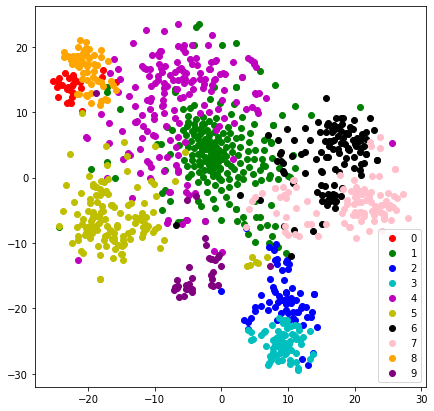

In [34]:
# T-SNE로 차원축소해서 이미지들 사이의 representation에 차이가 있는지 확인해본다
x_embedded_final = TSNE(n_components=2).fit_transform(final_representations)

target_ids = range(0,10)

plt.figure(figsize=(7, 7))
colors = 'r', 'g', 'b', 'c', 'm', 'y', 'k', 'pink', 'orange', 'purple', 'olive', 'lime', 'palevioletred','teal', 'papayawhip', 'thistle', 'slategray', 'darkseagreen', 'salmon', 'rebeccapurple', 'beige'
for i, c, label in zip(target_ids, colors, target_ids):
    plt.scatter(x_embedded_final [final_cluster_label == i, 0], x_embedded_final[final_cluster_label == i, 1], c=c, label=label)
plt.legend()
plt.show()

### 8-6. ImageNet-weight와 Self-Supervised weight로 만든 Cluster 비교하기.

ImageNet-weight로 representation vector를 추출해서 clustering했을 때보다, Self-supervised learning으로 representation vector를 추출해서 clustering 했을 때 더 명확한 Cluster가 생성된느 것을 확인할 수 있다. 이번에는 지난 스텝에서 살펴보았던 Clustering 과정을 다시 살펴보며, 그 결과를 비교해보겠다.

<br>

**CIFAR-10 이미지 자체로 만든 Cluster**

---
여러 이미지들이 섞여 있어 실질적으로 유의미한 결과를 얻을 수 없다.

cluster  0


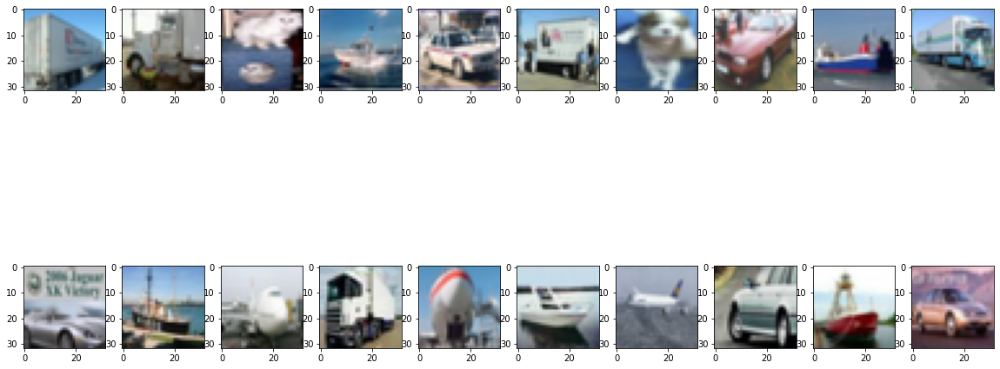

cluster  1


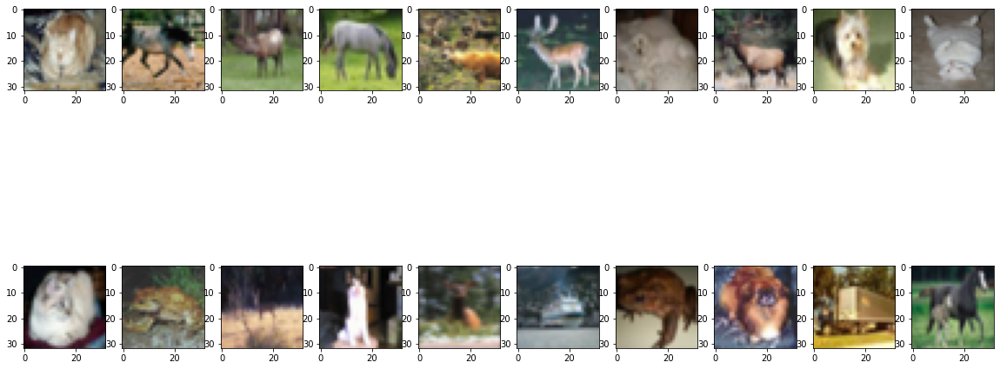

cluster  2


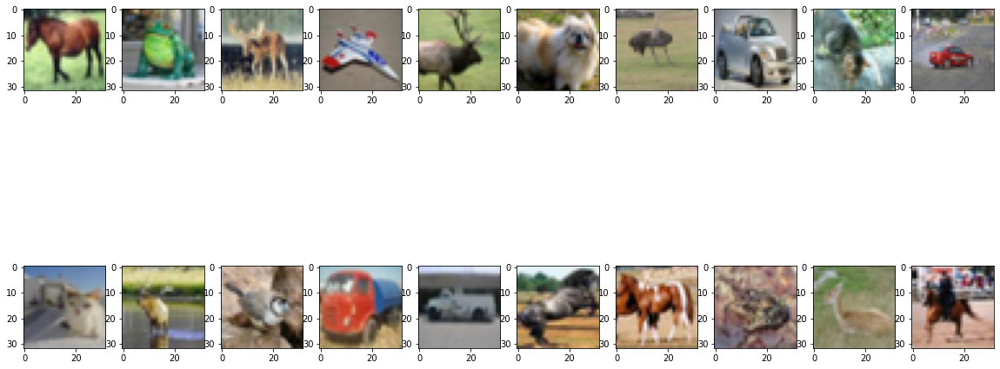

cluster  3


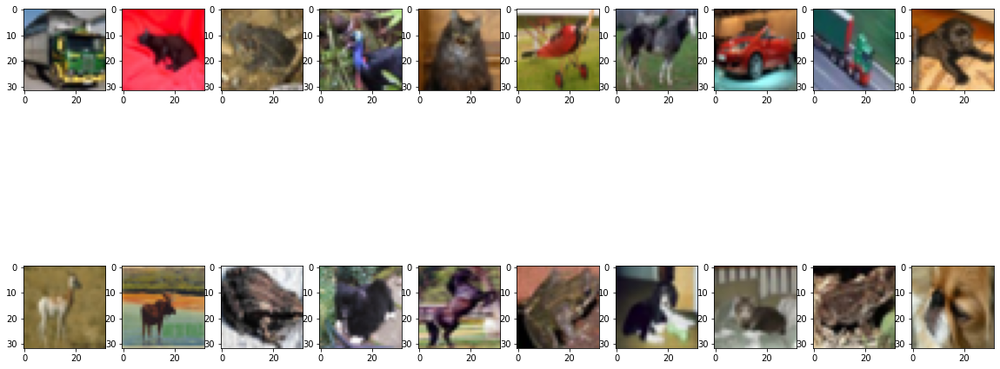

cluster  4


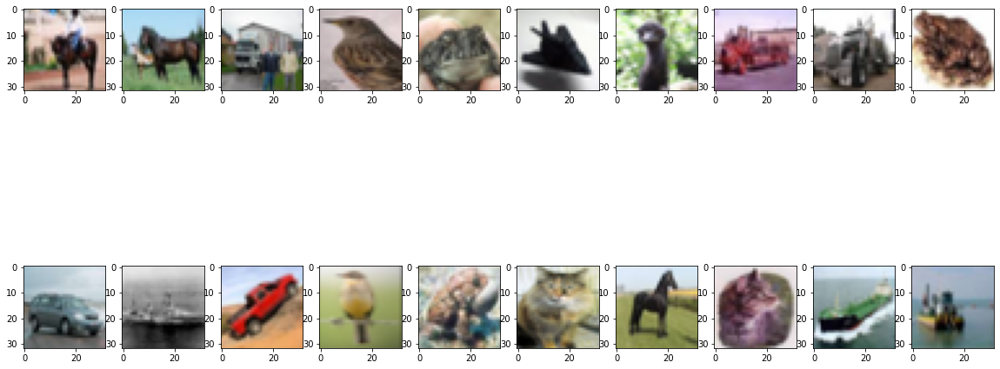

cluster  5


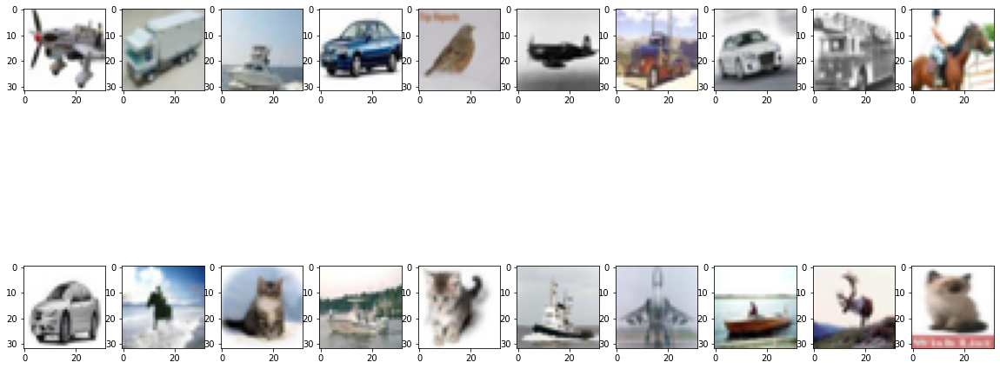

cluster  6


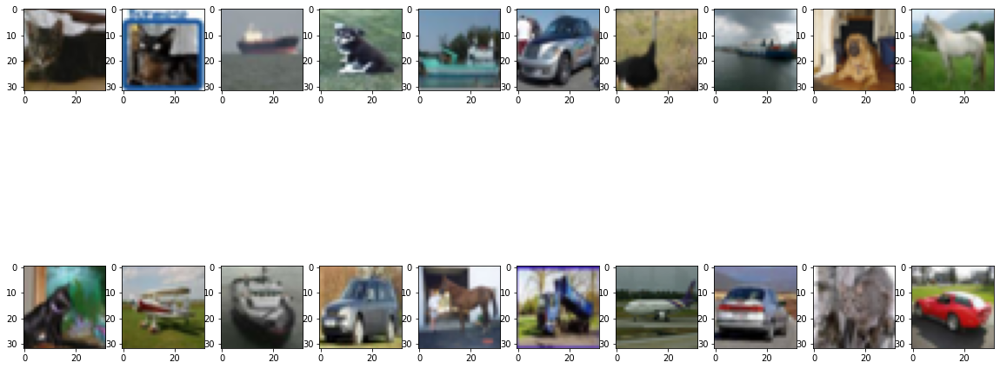

cluster  7


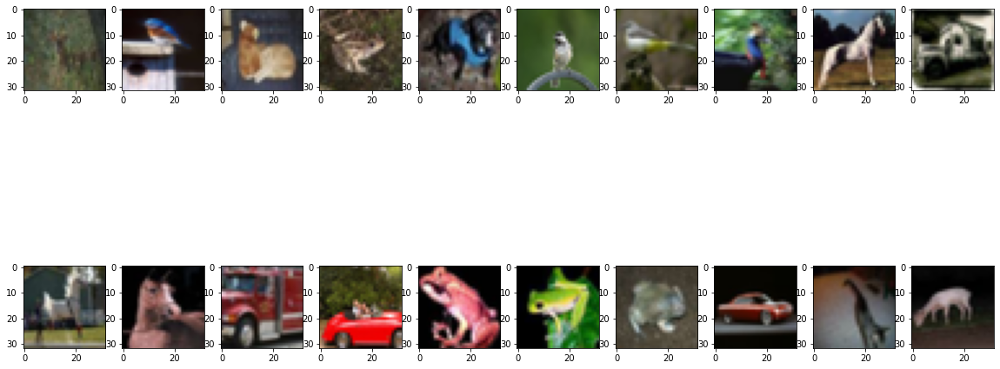

cluster  8


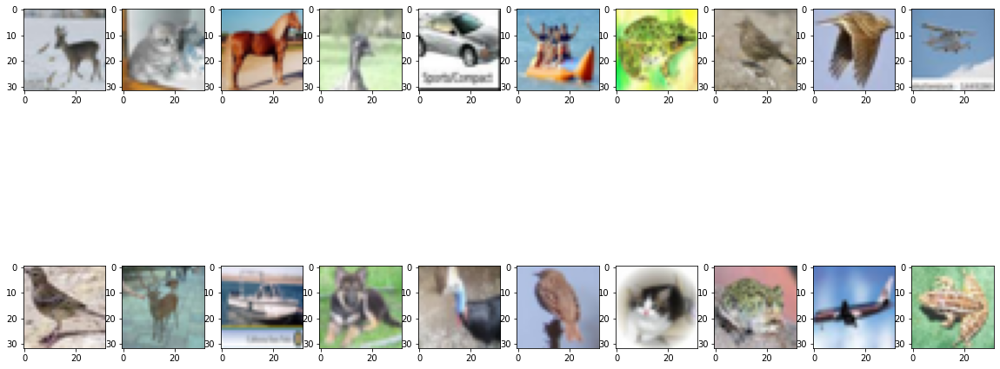

cluster  9


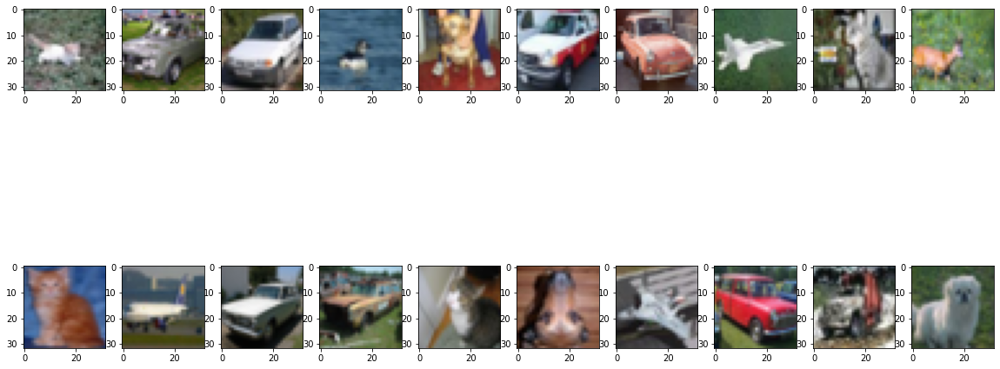

In [35]:
for id in range(10) : 
    # sample cluster 0
    print("cluster ", id)
    print("="*135)
    raw_selected_idxes = raw_cluster_label==id
    raw_selected_images = cifar10_1000[raw_selected_idxes]

    import matplotlib.pyplot as plt

    fig = plt.figure(figsize=(20, 10))
    columns = 10
    rows = 2
    for i in range(1, columns*rows +1):  # 샘플 10개 이미지만 골라서
        img = raw_selected_images[i] #
        fig.add_subplot(rows, columns, i)
        plt.imshow(img)# 이미지를 plotting 합니다.
    plt.show()

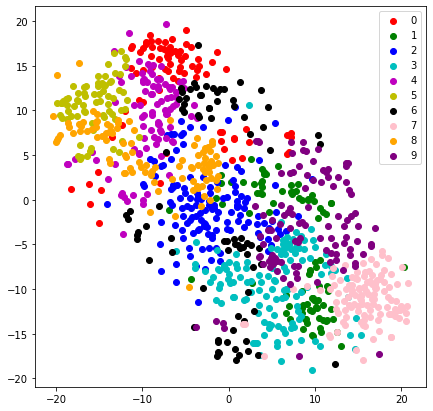

In [36]:
#colored by k-means cluster
target_ids = range(0,10)

#raw_x_embedded = TSNE(n_components=2).fit_transform(rep_vec)

plt.figure(figsize=(7, 7))
colors = 'r', 'g', 'b', 'c', 'm', 'y', 'k', 'pink', 'orange', 'purple', 'olive', 'lime', 'palevioletred','teal', 'papayawhip', 'thistle', 'slategray', 'darkseagreen', 'salmon', 'rebeccapurple', 'beige'
for i, c, label in zip(target_ids, colors, target_ids):
    plt.scatter(raw_x_embedded[raw_cluster_label == i, 0], raw_x_embedded[raw_cluster_label == i, 1], c=c, label=label)
plt.legend()
plt.show()

**ImageNet-weight로 만든 Cluster**

---
어느 정도 Clustering이 잘 되지만 다른 이미지들이 섞여있는 것을 볼 수 있다.

cluster  0


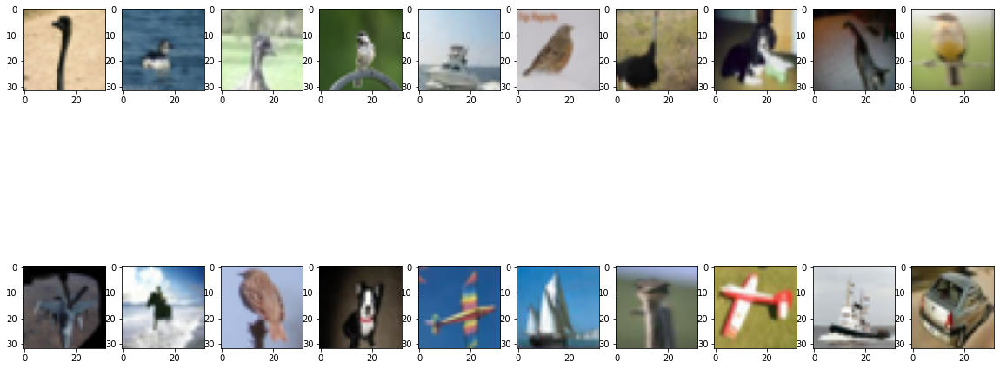

cluster  1


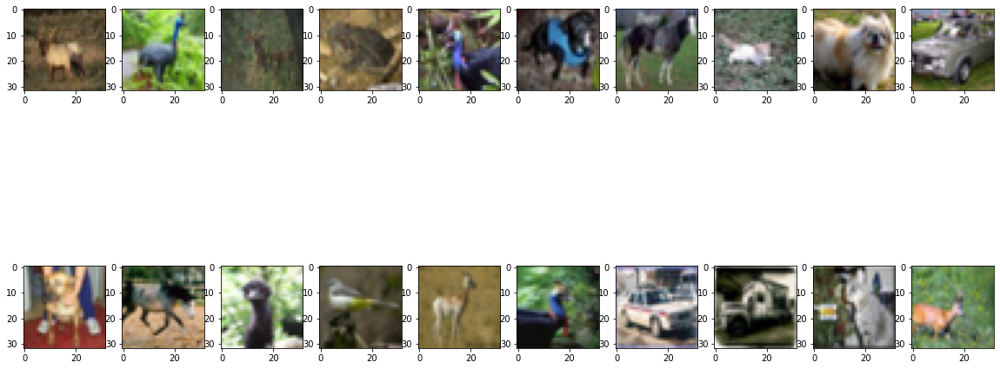

cluster  2


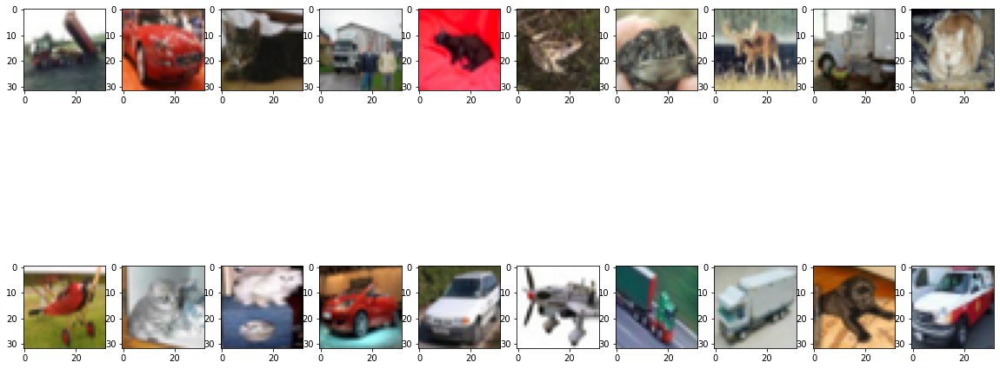

cluster  3


<Figure size 1440x720 with 0 Axes>

cluster  4


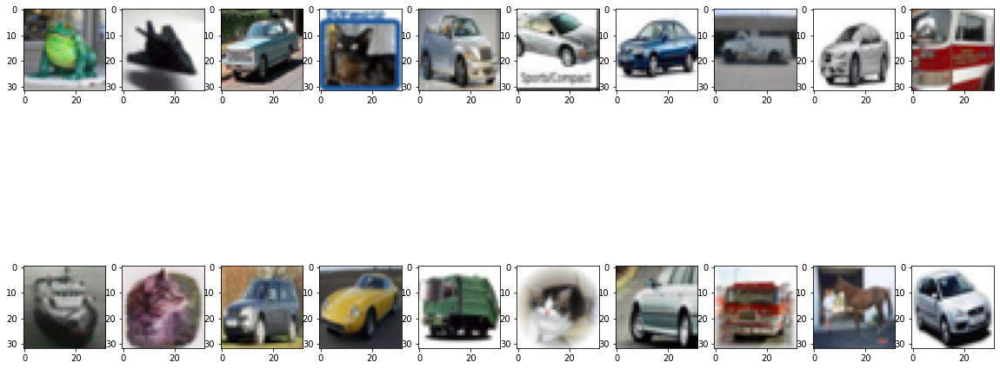

cluster  5


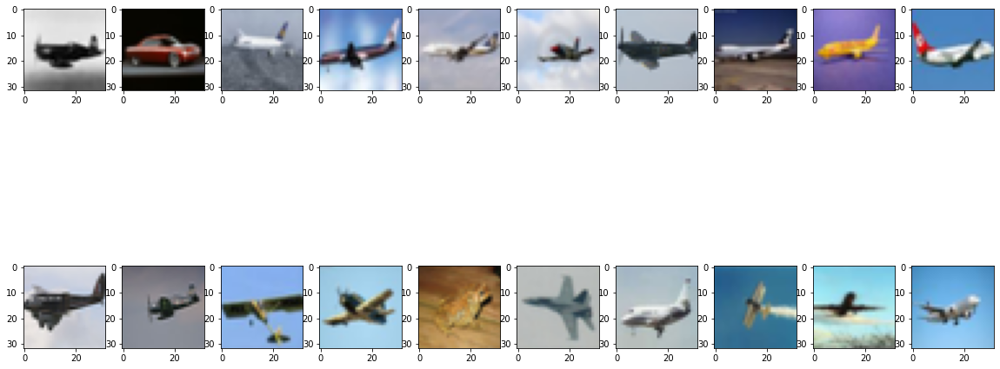

cluster  6


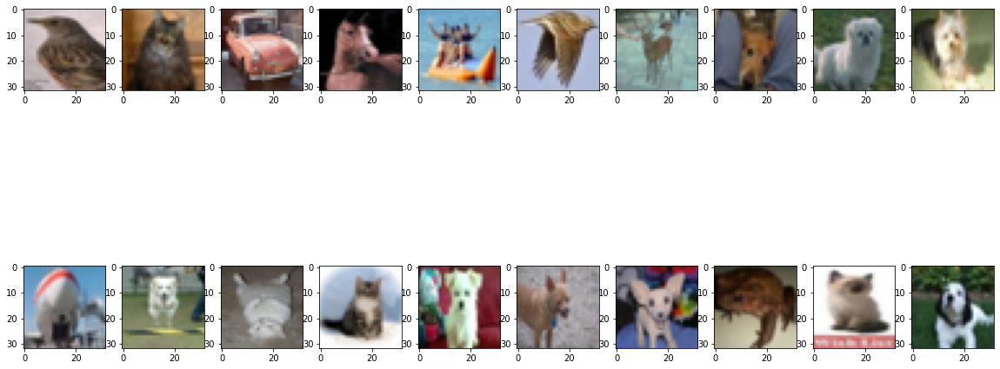

cluster  7


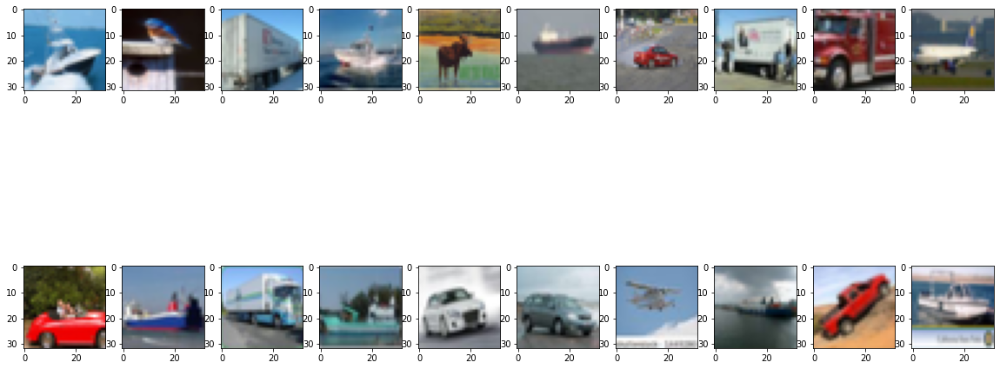

cluster  8


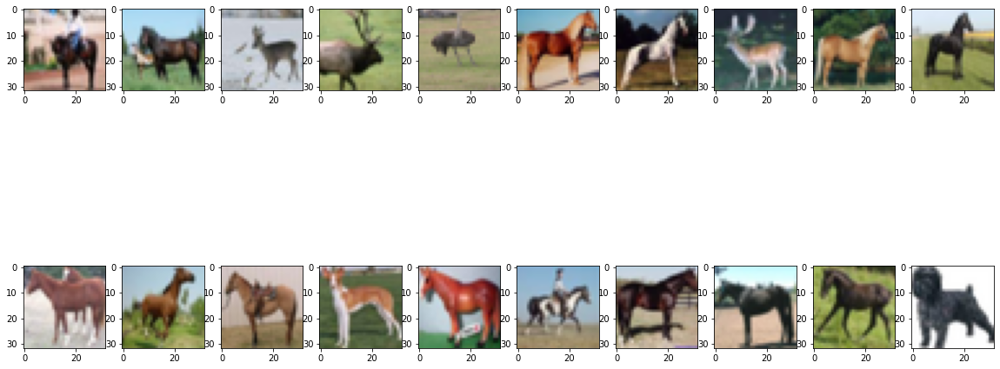

cluster  9


<Figure size 1440x720 with 0 Axes>

In [37]:
for id in range(10) : 
    print("cluster ", id)
    print("="*135)
    selected_idxes = cluster_label==id
    selected_filenames = filenames[selected_idxes]

    fig = plt.figure(figsize=(20, 10))
    columns = 10
    rows = 2
    for i in range(1, columns*rows +1):  # 샘플 10개 이미지만 골라서
        try : 
            filepath = selected_filenames[i]
            img = cv2.imread(filepath)[:,:,::-1] # 이미지로 읽은 후에 -> RGB 채널을 순서를 변경해주고

            fig.add_subplot(rows, columns, i)
            plt.imshow(img)# 이미지를 plotting 합니다
        except : 
            pass
    plt.show()

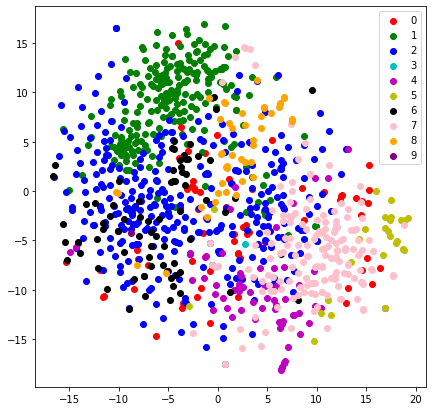

In [38]:
#colored by k-means cluster
#x_embedded = TSNE(n_components=2).fit_transform(representations)
target_ids = range(0,10)

plt.figure(figsize=(7, 7))
colors = 'r', 'g', 'b', 'c', 'm', 'y', 'k', 'pink', 'orange', 'purple', 'olive', 'lime', 'palevioletred','teal', 'papayawhip', 'thistle', 'slategray', 'darkseagreen', 'salmon', 'rebeccapurple', 'beige'
for i, c, label in zip(target_ids, colors, target_ids):
    plt.scatter(x_embedded[cluster_label == i, 0], x_embedded[cluster_label == i, 1], c=c, label=label)
plt.legend()
plt.show()

**Self-Supervised Learning으로 만든 Cluster**

---
하나의 Cluster 안에 유사한 이미지들끼리 잘 묶여있는 것을 확인할 수 있다.

cluster  0


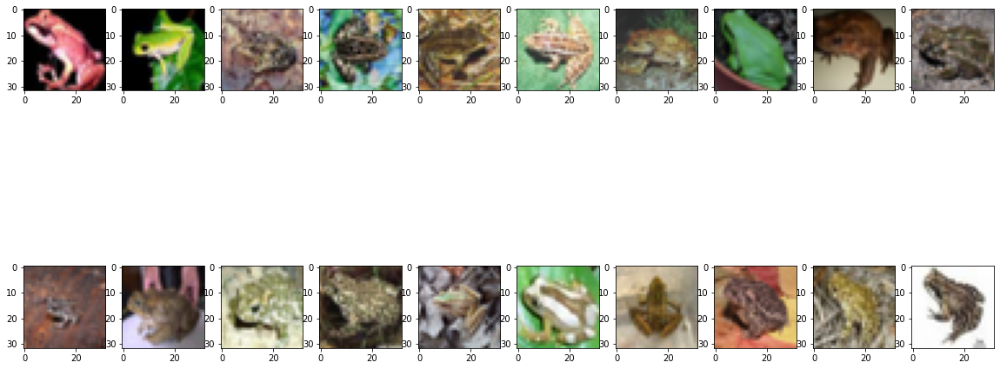

cluster  1


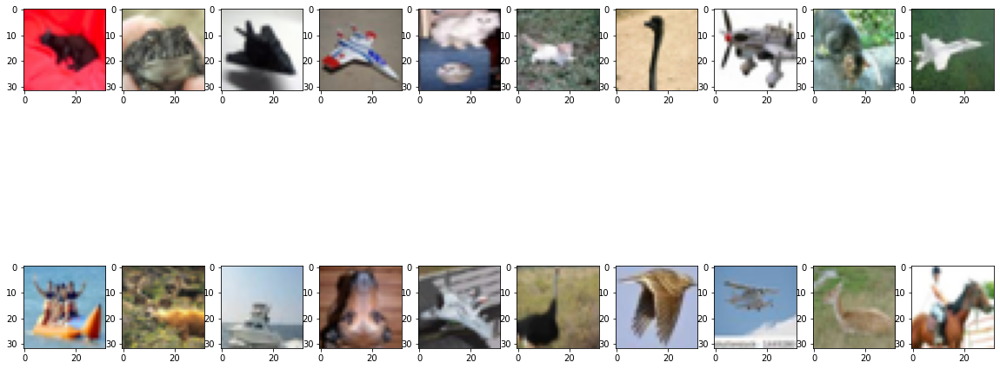

cluster  2


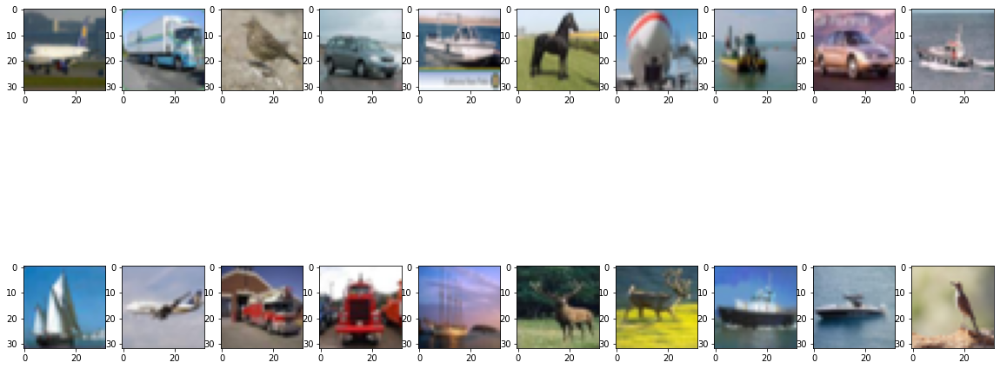

cluster  3


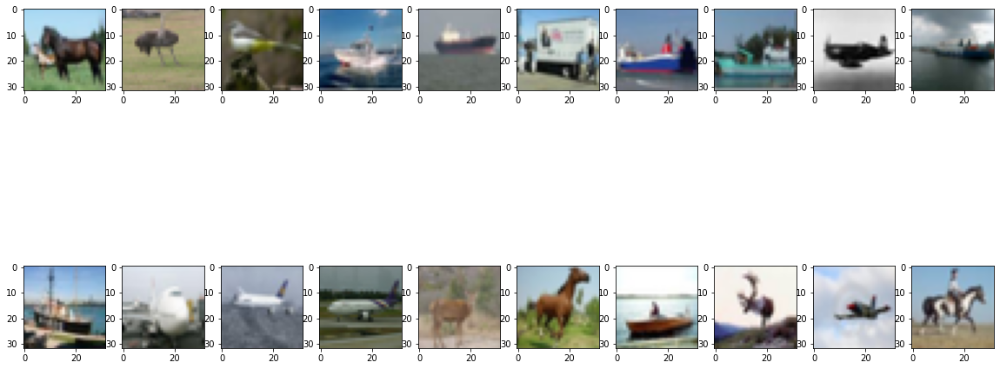

cluster  4


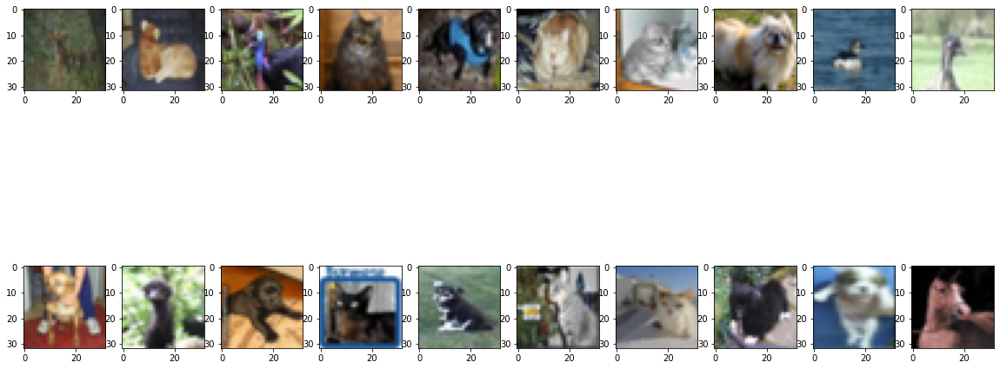

cluster  5


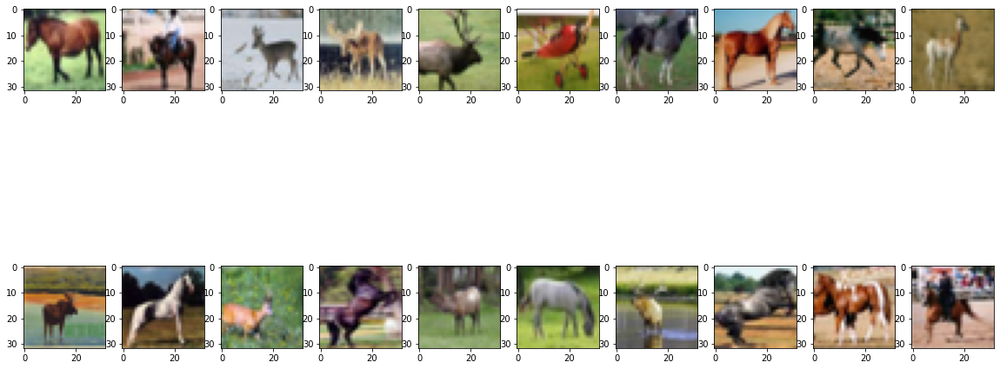

cluster  6


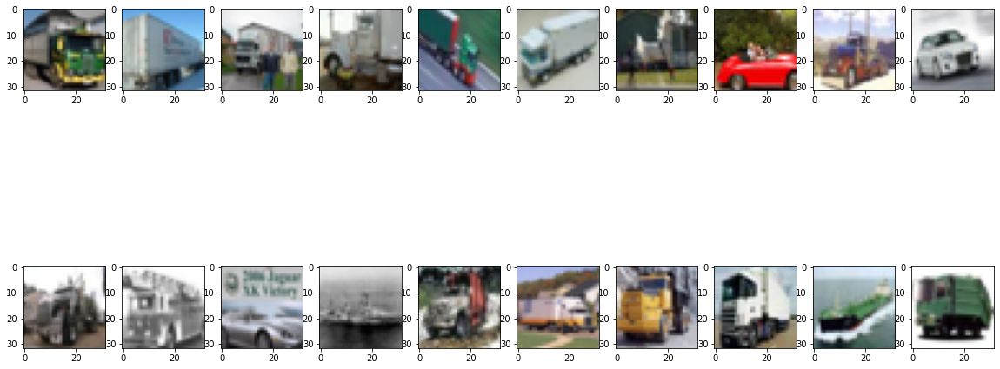

cluster  7


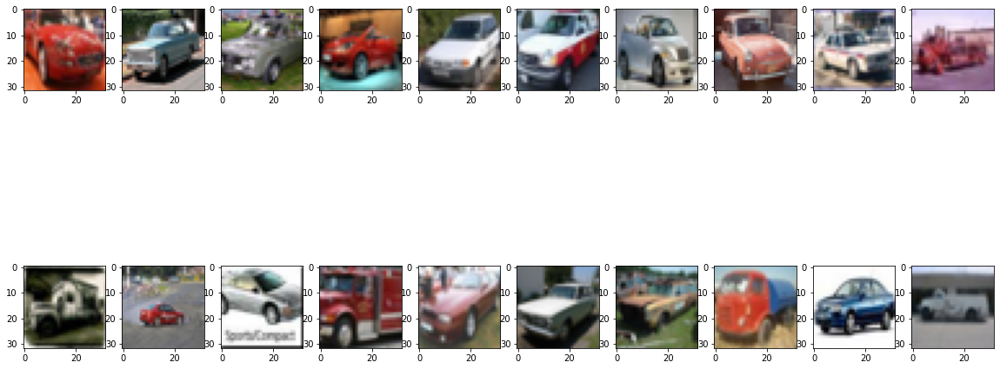

cluster  8


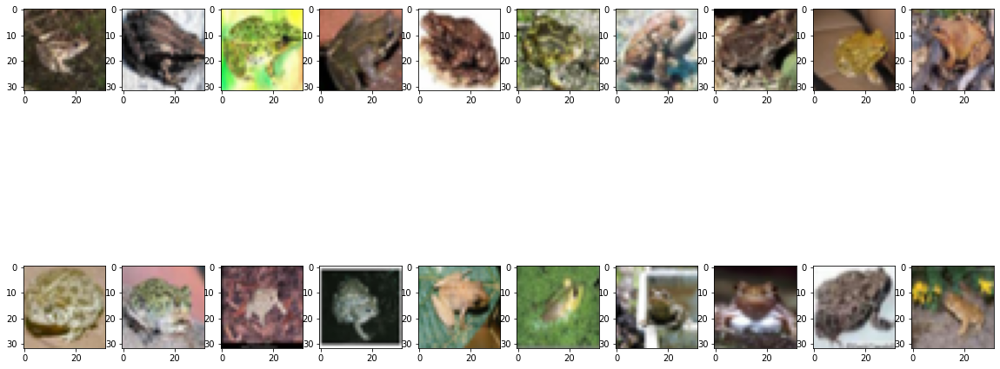

cluster  9


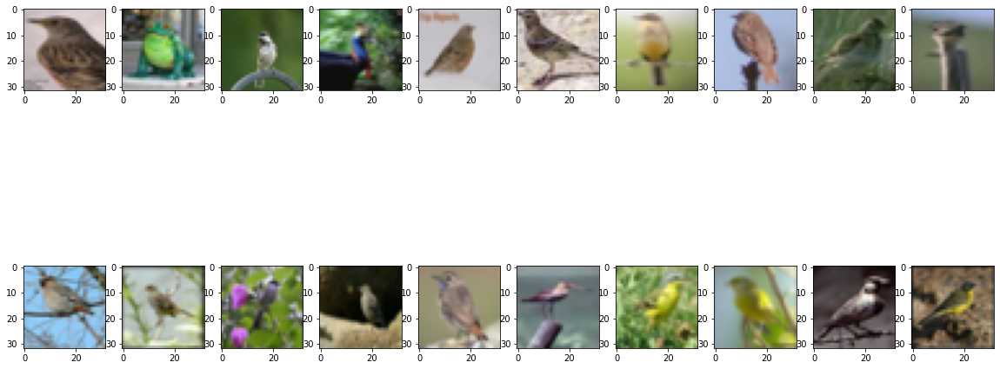

In [39]:
for id in range(10) : 
    print("cluster ", id)
    print("="*135)
    final_selected_idxes = final_cluster_label==id
    final_selected_filenames = filenames[final_selected_idxes]

    fig = plt.figure(figsize=(20, 10))
    columns = 10
    rows = 2
    for i in range(1, columns*rows +1):  # 샘플 10개 이미지만 골라서
        try :
            filepath = final_selected_filenames[i]
            img = cv2.imread(filepath)[:,:,::-1] # 이미지로 읽은 후에 -> RGB 채널을 순서를 변경해주고

            fig.add_subplot(rows, columns, i)
            plt.imshow(img)# 이미지를 plotting 합니다
        except : 
            pass
    plt.show()

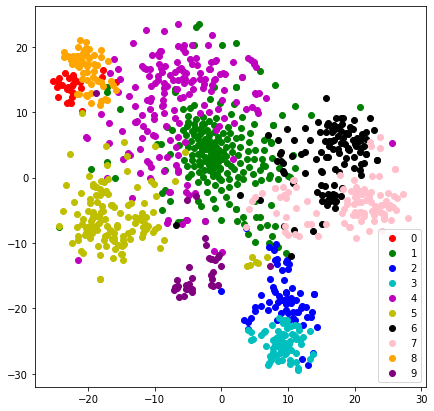

In [40]:
# D. T-SNE로 차원축소해서 이미지들 사이의 representation에 차이가 있는지 확인해본다
#x_embedded_final = TSNE(n_components=2).fit_transform(final_representations)

target_ids = range(0,10)

from matplotlib import pyplot as plt
plt.figure(figsize=(7, 7))
colors = 'r', 'g', 'b', 'c', 'm', 'y', 'k', 'pink', 'orange', 'purple', 'olive', 'lime', 'palevioletred','teal', 'papayawhip', 'thistle', 'slategray', 'darkseagreen', 'salmon', 'rebeccapurple', 'beige'
for i, c, label in zip(target_ids, colors, target_ids):
    plt.scatter(x_embedded_final [final_cluster_label == i, 0], x_embedded_final[final_cluster_label == i, 1], c=c, label=label)
plt.legend()
plt.show()